This notebook is the following part to analysis of the RefinedWeb, analyzed on Google Colab using GPU T4 to deal with advanced NLP techniques. With Keyword Extraction for Neutral and Positive Sentiment Analysis with high sentiment score

In [ ]:
## To check your memory
# !nvidia-smi
# from psutil import virtual_memory
# print(virtual_memory().total/1e9, "GB RAM")

# 1 Notebook Setup



In [ ]:
# Added all in requirement
# !pip install spacy
# !pip install keybert
# !pip install sentence-transformers
# !pip install -q tqdm            # run once in Colab / Jupyter

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.4/41.4 kB 2.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 72.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 52.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 32.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 10.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 39.4 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling

In [ ]:
# Core Python Utilities
from collections import Counter       # Count frequencies of elements
from pathlib import Path              # Filesystem paths (e.g., Path("data/file.csv"))
import ast                            # Safe literal parsing (e.g., from string to dict)
import re                             # Regular expressions
import numpy as np                    # Array computing and math ops
import pandas as pd                   # DataFrame operations
import psutil                         # System/process utilities (e.g., memory usage)

# Progress & Performance
from tqdm import tqdm                 # Progress bars for loops

# Visualization
import matplotlib.pyplot as plt       # General plotting
import seaborn as sns                 # Statistical visualization
from matplotlib import cm             # Colormaps
from matplotlib.colors import Normalize  # Normalize values for color scaling
from wordcloud import WordCloud       # Generate word clouds
from IPython.display import display, HTML  # Display tables and HTML content in notebooks
import plotly.express as px           # Interactive plotting (optional)

# Math & Statistics
from scipy.special import softmax     # Convert logits to probabilities
from scipy.stats import spearmanr     # Rank correlation coefficient

# NLP & Transformers
import spacy                          # NLP pipeline (tokenization, NER, POS, etc.)
import torch                          # Tensor operations (backend for transformers)
from transformers import (            # HuggingFace Transformers
    AutoModelForSequenceClassification,
    AutoTokenizer,
    pipeline
)

# Embeddings & Keyword Extraction
from keybert import KeyBERT                       # Keyword extraction using embeddings
from sentence_transformers import SentenceTransformer  # Sentence embeddings (e.g., MiniLM)

Exception ignored in: <function _xla_gc_callback at 0x7e3295a3e980>
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/jax/_src/lib/__init__.py", line 96, in _xla_gc_callback
    def _xla_gc_callback(*args):
    
KeyboardInterrupt: 


In [ ]:
from tqdm.notebook import tqdm   # notebook-friendly progress bar
tqdm.pandas()                    # enable progress_apply()

In [ ]:
# (optional) if run in Google Collab
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Load the data
df = pd.read_parquet('/content/drive/MyDrive/pretrained_refinedweb_updated_shared/before_sentiment_all_brands.parquet')

In [ ]:
df.head()

,doc_id,content,url,timestamp,image_urls,brand_name,year
0,21,tuesday april colour pakistan favorite collect...,http://couturebano.blogspot.com/2012/,2017-04-23 12:42:59,[],H&M,2017
1,24,story rachel well photo ken irwin ken th janua...,http://www.theage.com.au/victoria/uniqlo-gives...,2014-09-15 04:33:28,[],Zara,2014
2,63,learn style watch people runway happen every m...,http://www.styledintofashion.com/2014/03/doubl...,2019-10-14 04:47:46,[],Zara,2019
3,74,prweb august cream specialist medium agency pr...,https://www.prweb.com/releases/2013/8/prweb110...,2019-04-18 12:35:29,[],Burberry,2019
4,79,undated several store south africa temporarily...,https://www.1043theparty.com/2018/01/15/hm-sou...,2018-09-18 19:15:47,[],H&M,2018


In [ ]:
num_rows = df.shape[0]           # inline: .shape[0] returns the number of rows
print(f"Total rows: {num_rows}")                    # inline: display the row count

Total rows: 13524


# 2 Sentiment Analysis Using Sentiment Engine

#### Sentiment Engine · [RoBERTa-large (3-class)](https://huggingface.co/j-hartmann/sentiment-roberta-large-english-3-classes)
**`j-hartmann/sentiment-roberta-large-english-3-classes`**

| Aspect | Details |
|--------|---------|
| **Background** | RoBERTa-large, fine-tuned on 5,304 hand-labelled social-media posts; 3 classes (positive / neutral / negative); hold-out accuracy ≈ 86 % :contentReference[oaicite:0]{index=0} |
| **Benefits** | • Three-way output gives nuance<br>• Provides per-class confidence scores<br>• Strong on informal English typical of comments & reviews<br>• Works out-of-the-box with `transformers` pipeline |
| **Fit for fashion-retail webpages** | Ideal for classifying user reviews, blog comments, or UGC about brands (Zara, H&M, etc.); confidence scores let you flag content needing manual follow-up; easy to embed in Python, Spark or JS pipelines |
| **Limitations** | Small training set → may miss domain slang (“fit”, “haul”); no sarcasm handling; English-only; not tuned for very long product pages (truncate >512 tokens) |

<!-- Blue note box -->
<div style="border-left:4px solid #2196f3; background:#e3f2fd; padding:12px; font-family:sans-serif;">
  <strong>Note:</strong> This code block is intentionally hidden because it takes a long time to run. You can skip it and proceed directly to the data-download in next steps instead, The project use Google Colab to run sentiment analysis as T4 GPU available but Ai8 have only CPU, The code below provided similarly when running in different environment with fixed version control and configuration of requirement. After getting results, we explored the data on Ai8 and filtering only positive sentiment with high confidence on Ai8
</div>

In [ ]:
# # Load pipeline
# sentiment_model = pipeline(
#     "sentiment-analysis",
#     model="j-hartmann/sentiment-roberta-large-english-3-classes",
#     device=0  # or -1 for CPU
# )
# tokenizer = sentiment_model.tokenizer

# # Map label to score
# label_to_score = {'negative': -1, 'neutral': 0, 'positive': 1}

# # Fixed chunker (no duplicate kwargs)
# def tokenize_chunks(text, max_tokens=512, stride=50):
#     enc = tokenizer(
#         text,
#         return_attention_mask=False,
#         return_token_type_ids=False,
#         return_overflowing_tokens=True,
#         truncation=True,
#         max_length=max_tokens,
#         stride=stride,
#         return_offsets_mapping=False
#     )
#     return [
#         tokenizer.decode(ids, skip_special_tokens=True)
#         for ids in enc["input_ids"]
#     ]

# # Compute average sentiment
# def compute_avg_sentiment(text):
#     chunks = tokenize_chunks(text)
#     if not chunks:
#         return {'sentiment_label': 'neutral', 'confidence': 0.0, 'sentiment_score': 0.0}

#     results = sentiment_model(chunks, truncation=True)
#     scores = [label_to_score[r['label'].lower().replace("label_", "")] for r in results]
#     confidences = [r['score'] for r in results]

#     avg_score = float(np.mean(scores))
#     avg_confidence = float(np.mean(confidences))

#     if avg_score > 0.1:
#         final_label = 'positive'
#     elif avg_score < -0.1:
#         final_label = 'negative'
#     else:
#         final_label = 'neutral'

#     return {
#         'sentiment_label': final_label,
#         'confidence': round(avg_confidence, 4),
#         'sentiment_score': round(avg_score, 4)
#     }


In [ ]:
# # Apply sentiment to DataFrame
# tqdm.pandas()
# df_sentiment_pd[['sentiment_label','sentiment_score','confidence']] = (
#     df_sentiment_pd['content']
#     .progress_apply(compute_avg_sentiment)
#     .apply(pd.Series)
# )

In [ ]:
df = df_sentiment_pd

In [ ]:
df.count()

,0
doc_id,13524
content,13524
url,13524
timestamp,13524
image_urls,13524
brand_name,13524
year,13524
sentiment_label,13524
sentiment_score,13524
confidence,13524


In [ ]:
# Each sentiment label
df["sentiment_label"].value_counts()

,count
sentiment_label,
neutral,9492
positive,3441
negative,591


In [ ]:
# Keep only rows with a positive sentiment
df_positive = df[
    (df["sentiment_label"] == "positive") &
    (df["confidence"] > 0)
]

# Check how many positive rows remain (optional)
positive_count = df_positive["sentiment_label"].value_counts()
print(positive_count)

sentiment_label
positive    3441
Name: count, dtype: int64


In [ ]:
df_positive.count()

,0
doc_id,3441
content,3441
url,3441
timestamp,3441
image_urls,3441
brand_name,3441
year,3441
sentiment_label,3441
sentiment_score,3441
confidence,3441


In [ ]:
# Aggregate sentiment scores per brand
brand_sentiment_summary_pos_high_conf = (
    df_positive.groupby('brand_name')
      .agg(
          avg_sentiment_score=('sentiment_score', 'mean'),
          avg_confidence=('confidence', 'mean'),
          count=('sentiment_score', 'count')
      )
      .reset_index()
      .round({'avg_sentiment_score': 3, 'avg_confidence': 3})
)

In [ ]:
brand_sentiment_summary_pos_high_conf.sort_values('avg_sentiment_score', ascending=False)

,brand_name,avg_sentiment_score,avg_confidence,count
2,Primark,0.958,0.979,500
1,H&M,0.946,0.962,2095
3,Zara,0.946,0.952,643
0,Burberry,0.923,0.941,203


## Save as a checkpoint

**Note:** The code block below might have been intentionally hidden to prevent unintentional multiple downloads during testing of the dataset. This is a best practice to avoid redundant operations that may consume unnecessary resources or lead to duplicate file writes.

In [ ]:
# output_path = Path("/content/drive/MyDrive/pretrained_refinedweb_updated_shared/pos_high_conf_final_version_before_keybert.csv")
# df_positive.to_csv(output_path, index=False)

# 3 Top Keyword Model

In [ ]:
# Define path
output_path = Path("/content/drive/MyDrive/pretrained_refinedweb_updated_shared/pos_high_conf_final_version_before_keybert.csv")

# Load the Parquet file
df = pd.read_csv(output_path)

In [ ]:
df.head()

,content,url,timestamp,brand_name,sentiment_label,sentiment_score,year,month,day,full_date,time,url_host,url_tld,url_domain,url_path,has_ugc_keyword,page_length,web_category,co_mentioned_brands,confidence
0,friday night girl courtney ellen december nigh...,http://abbymaried.blogspot.com/2012/12/get-win...,2017-05-22 22:22:02,h&m,positive,0.9526,2017,5,22,2017-05-22,22:22:02,blogspot.com,com,blogspot.com,/2012/12/get-winter-look-for-less-fashion-forw...,False,88,blogs & community,[],1.0
1,cute skirt hype spring mar today present cute ...,http://admin.crazyforus.com/articles/24-cute-s...,2017-05-22 18:07:36,h&m,positive,0.9225,2017,5,22,2017-05-22,18:07:36,crazyforus.com,com,crazyforus.com,/articles/24-cute-skirts-under-30-that-will-ge...,False,175,news,[],1.0
2,addict scarf em always cold side scarf blanket...,http://aimee-weaver.blogspot.com/2013/04/hello...,2018-09-18 18:48:12,h&m,positive,0.9991,2018,9,18,2018-09-18,18:48:12,blogspot.com,com,blogspot.com,/2013/04/hello-my-name-is-aimee.html,False,80,blogs & community,[],1.0
3,scarf scarf everywhere cute fat honest add pat...,http://arealfineplace.com/scarves/,2019-11-12 05:20:31,h&m,positive,0.9972,2019,11,12,2019-11-12,05:20:31,arealfineplace.com,com,arealfineplace.com,/scarves/,False,90,others,[],1.0
4,sunday sunday beautiful comfy central park hee...,http://bangbangblond.blogspot.com/2014/05/cent...,2018-02-18 01:24:14,zara,positive,0.9991,2018,2,18,2018-02-18,01:24:14,blogspot.com,com,blogspot.com,/2014/05/central-park.html,False,50,blogs & community,[],1.0


### What is `KeyBERT`?

`KeyBERT` is a Python library for extracting **keywords or keyphrases** from text using **BERT-based embeddings**.

### KeyBERT Overview

This initializes a `KeyBERT` model using `all-MiniLM-L6-v2`, a fast and efficient sentence embedding model from SentenceTransformers.

#### How It Works

1. The full document is embedded using a BERT-like model.
2. Candidate phrases from the document are also embedded.
3. Cosine similarity is calculated between the document and each candidate phrase.
4. The most similar phrases are returned as keywords.

#### Benefits

- Works out-of-the-box with no training required
- Context-aware keyword extraction
- Fast and lightweight with MiniLM
- Supports multiple ranking strategies (e.g., MMR, MaxSum)


#### Limitations

- Extractive only (selects words from the text, does not generate)
- Quality depends on the input and the embedding model
- May include off-topic results in short or noisy texts
- Limited performance on non-English texts without proper models


# `top_n` and `stop_words` in KeyBERT

When using `KeyBERT` to extract keywords, you can control the output with parameters like `top_n` and `stop_words`.

#### `top_n`

- Specifies how many **top-ranked keywords** you want to extract.
- It returns only the top `n` phrases based on their similarity score to the full document.
- We set top_n = 5 which This will return the 5 most relevant keywords/phrases.

### `stop_words`

- Removes common, non-informative words (like "the", "is", "and") from keyword candidates.
- Helps improve keyword quality by filtering out generic terms.
- Can be set to:
  - `'english'` — uses a built-in list of English stopwords
  - A **custom list** of stopwords
  - `None` — to disable stopword removal

In [ ]:
kw_model = KeyBERT(model="all-MiniLM-L6-v2")

modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md: 0.00B [00:00, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

## Word Extraction Analysis

We will cover Unigram analysis, Uni-bi analysis and Bigram analysis with the same configuration below
- stop_words = 'english'
- top_n = 5
- We will analyze 3 aspects, Unigram / Uni-bi and Bigram

<!-- Blue note box -->
<div style="border-left:4px solid #2196f3; background:#e3f2fd; padding:12px; font-family:sans-serif;">
  <strong>Note:</strong> This code block is intentionally hidden because it takes a long time to run. You can skip it and proceed directly to the data-download in next steps insteadmm
</div>

## Unigram Top Keyword Extraction

In [ ]:
# Config 1: N-gram = (1, 1)
# df['kw_unigram'] = df['content'].progress_apply(
#     lambda x: [kw[0] for kw in kw_model.extract_keywords(x, keyphrase_ngram_range=(1, 1), stop_words='english', top_n=5)]
# )

  0%|          | 0/13523 [00:00<?, ?it/s]

## Save As Checkpoint

**Note:** The code block below might have been intentionally hidden to prevent unintentional multiple downloads during testing of the dataset. This is a best practice to avoid redundant operations that may consume unnecessary resources or lead to duplicate file writes.

In [ ]:
# output_path = Path("/content/drive/MyDrive/pretrained_refinedweb_updated_shared/pos_high_conf_nlp-added-features-unigram.csv")
# df.to_csv(output_path, index=False)

## Uni-Bigram Top Keyword Extraction

In [ ]:
# Config 2: N-gram = (1, 2)
# df['kw_uni_bi'] = df['content'].progress_apply(
#     lambda x: [kw[0] for kw in kw_model.extract_keywords(x, keyphrase_ngram_range=(1, 2), stop_words='english', top_n=5)]
# )

  0%|          | 0/13523 [00:00<?, ?it/s]

## Save As Checkpoint

**Note:** The code block below might have been intentionally hidden to prevent unintentional multiple downloads during testing of the dataset. This is a best practice to avoid redundant operations that may consume unnecessary resources or lead to duplicate file writes.

In [ ]:
# output_path = Path("/content/drive/MyDrive/pretrained_refinedweb_updated_shared/pos_high_conf_nlp-added-features-uni-bi.csv")
# df.to_csv(output_path, index=False)

## Bigram Top Keyword Extraction

## Save As Checkpoint

In [ ]:
# Config 3: N-gram = (2, 2) only phrases
# df['kw_bigram'] = df['content'].progress_apply(
#     lambda x: [kw[0] for kw in kw_model.extract_keywords(x, keyphrase_ngram_range=(2, 2), stop_words='english', top_n=5)]
# )

  0%|          | 0/13523 [00:00<?, ?it/s]

## Save as a checkpoint

**Note:** The code block below might have been intentionally hidden to prevent unintentional multiple downloads during testing of the dataset. This is a best practice to avoid redundant operations that may consume unnecessary resources or lead to duplicate file writes.

In [ ]:
# output_path = Path("/content/drive/MyDrive/pretrained_refinedweb_updated_shared/pos_high_conf_nlp-added-features-bi.csv")
# df.to_csv(output_path, index=False)

# 4 Keyword Exploration

In [ ]:
# Load the data
output_path = Path("/content/drive/MyDrive/pretrained_refinedweb_updated_shared/pos_high_conf_nlp-added-features-bi.csv")
df = pd.read_csv(output_path)

In [ ]:
df.head()

,content,url,timestamp,brand_name,sentiment_label,sentiment_score,year,month,day,full_date,...,url_domain,url_path,has_ugc_keyword,page_length,web_category,co_mentioned_brands,confidence,kw_unigram,kw_uni_bi,kw_bigram
0,friday night girl courtney ellen december nigh...,http://abbymaried.blogspot.com/2012/12/get-win...,2017-05-22 22:22:02,h&m,positive,0.9526,2017,5,22,2017-05-22,...,blogspot.com,/2012/12/get-winter-look-for-less-fashion-forw...,False,88,blogs & community,[],1.0,"['friday', 'dress', 'christmas', 'plaid', 'car...","['friday night', 'rock friday', 'december nigh...","['friday night', 'rock friday', 'december nigh..."
1,cute skirt hype spring mar today present cute ...,http://admin.crazyforus.com/articles/24-cute-s...,2017-05-22 18:07:36,h&m,positive,0.9225,2017,5,22,2017-05-22,...,crazyforus.com,/articles/24-cute-skirts-under-30-that-will-ge...,False,175,news,[],1.0,"['skirt', 'fashiontofigure', 'nordstrom', 'fau...","['skirt faux', 'skirt missguided', 'skirt fore...","['skirt faux', 'skirt missguided', 'skirt fore..."
2,addict scarf em always cold side scarf blanket...,http://aimee-weaver.blogspot.com/2013/04/hello...,2018-09-18 18:48:12,h&m,positive,0.9991,2018,9,18,2018-09-18,...,blogspot.com,/2013/04/hello-my-name-is-aimee.html,False,80,blogs & community,[],1.0,"['scarf', 'scarves', 'blanket', 'worn', 'jacket']","['cold scarf', 'scarf blanket', 'etsy scarf', ...","['cold scarf', 'scarf blanket', 'etsy scarf', ..."
3,scarf scarf everywhere cute fat honest add pat...,http://arealfineplace.com/scarves/,2019-11-12 05:20:31,h&m,positive,0.9972,2019,11,12,2019-11-12,...,arealfineplace.com,/scarves/,False,90,others,[],1.0,"['scarf', 'nordstrom', 'outfitter', 'knit', 't...","['scarf scarf', 'love scarf', 'scarf', 'scarf ...","['scarf scarf', 'love scarf', 'scarf cute', 's..."
4,sunday sunday beautiful comfy central park hee...,http://bangbangblond.blogspot.com/2014/05/cent...,2018-02-18 01:24:14,zara,positive,0.9991,2018,2,18,2018-02-18,...,blogspot.com,/2014/05/central-park.html,False,50,blogs & community,[],1.0,"['sunday', 'monday', 'park', 'walk', 'central']","['sunday enjoy', 'sunday beautiful', 'sunday',...","['sunday enjoy', 'sunday beautiful', 'monday e..."


In [ ]:
num_rows = df.shape[0]           # inline: .shape[0] returns the number of rows
print(f"Total rows: {num_rows}")                    # inline: display the row count

Total rows: 3262


# Top keywords by brand Analysis

## Unigram

### Overall top keyword - Bar chart

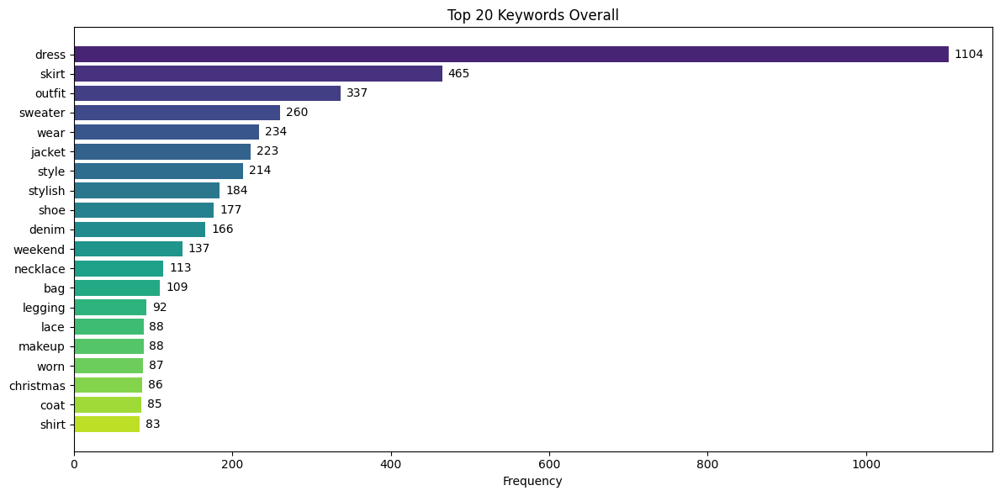

In [ ]:
all_keywords = [kw for kws in df['kw_unigram'] for kw in eval(kws)]
keyword_counts = Counter(all_keywords)
top_keywords = keyword_counts.most_common(20)
labels, values = zip(*top_keywords)

cmap = plt.get_cmap('viridis')                      # or 'plasma', 'cividis', etc.
colors = cmap(np.linspace(0.1, 0.9, len(labels)))   # avoid extremes of the colormap

fig, ax = plt.subplots(figsize=(12, 6))
bars = ax.barh(labels[::-1], values[::-1], color=colors[::-1])

ax.bar_label(bars, labels=[f"{v}" for v in values[::-1]], padding=5, fontsize=10)

ax.set_title("Top 20 Keywords Overall")
ax.set_xlabel("Frequency")
plt.tight_layout()
plt.show()

###  Overall top keyword - Bar chart (Filtering out of neutral keyword of fashion product)

In [ ]:
# Neutral fashion/retail words (expanded)
neutral_words = {
    'blouse', 'bag', 'cardigan', 'coat', 'delivery', 'denim', 'discount',
    'dress', 'fashion', 'fit', 'jacket', 'jeans', 'look', 'pants', 'price',
    'return', 'sale', 'shirt', 'shop', 'shopping', 'shorts', 'skirt', 'style',
    'sweater', 't-shirt', 'trousers', 'trend', 'outfit', 'wear', 'shoe',
    'sneaker', 'garment', 'footwear', 'brand', 'sleeve',
    'necklace', 'lipstick', 'worn', 'makeup', 'tights',
    'belt', 'sunglasses', 'colour', 'pink', 'warm', 'shopper',

    # Irrelevant words to remove
    'restaurant', 'hotel', 'retailer', 'supermarket', 'consumer', 'apparel',
    'industry', 'casino', 'royal', 'market', 'grocery', 'city',
    'blog', 'demand', 'marketing', 'jewelry', 'perfume', 'fragrance', 'scent',
    'stylish', 'legging', 'boutique',

    # Additional words - human judgement
    'balmain', 'dress dress', 'mall', 'eyeshadow', 'bag, glamour', 'nordstrom',
    'leather bag', 'dress shoe', 'designer bag', 'designer handbag',
    'American apparel', 'skirt bag', 'necklace topshop', 'skirt topshop',
    'charity shop',
    'Saturday', 'sunshine', 'gown', 'galmour', 'birthday', 'sunny',
    'mascara', 'handback', 'shade', 'skirt topshop', 'happy Friday', 'happy sunday'
}


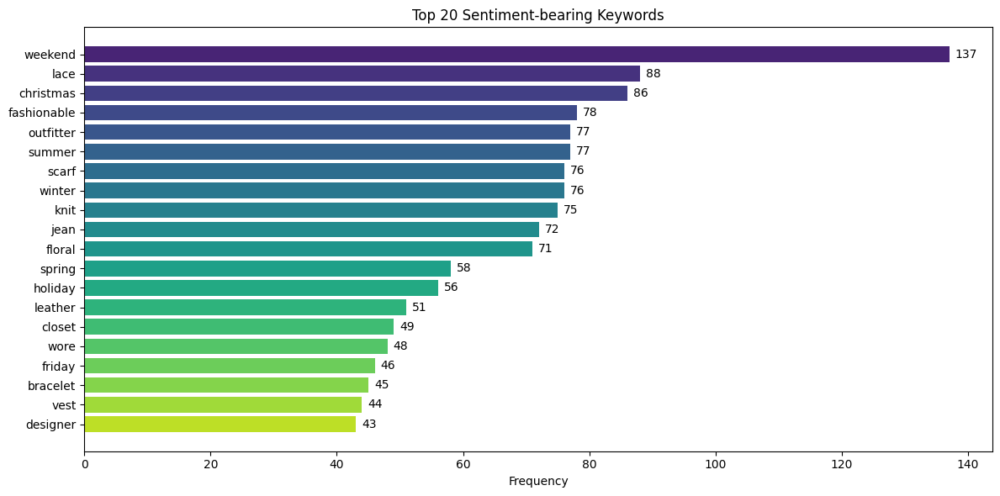

In [ ]:
all_keywords = [
    kw
    for kws in df['kw_unigram']
    for kw in eval(kws)
    if kw not in neutral_words
]

keyword_counts = Counter(all_keywords)
top_keywords = keyword_counts.most_common(20)
labels, values = zip(*top_keywords)

cmap = plt.get_cmap('viridis')
colors = cmap(np.linspace(0.1, 0.9, len(labels)))

fig, ax = plt.subplots(figsize=(12, 6))
bars = ax.barh(labels[::-1], values[::-1], color=colors[::-1])
ax.bar_label(bars, labels=[f"{v}" for v in values[::-1]], padding=5, fontsize=10)

ax.set_title("Top 20 Sentiment‐bearing Keywords")
ax.set_xlabel("Frequency")
plt.tight_layout()
plt.show()


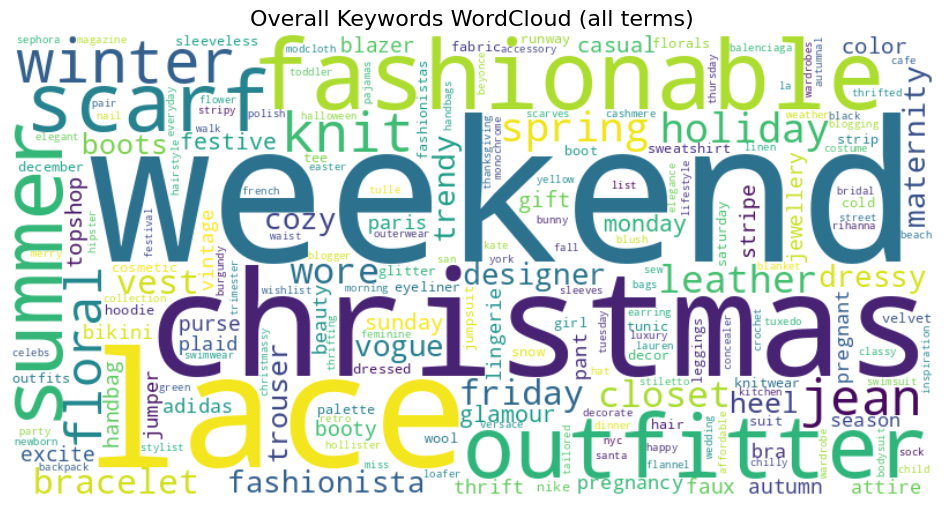

In [ ]:
# Flatten all keywords (excluding neutrals) into one big list
all_keywords = [
    kw
    for kws in df['kw_unigram']
    for kw in eval(kws)
    if kw not in neutral_words
]

# Count frequencies of every keyword
keyword_counts = Counter(all_keywords)

# Generate the WordCloud from the full frequency dict
wc = WordCloud(
    width=800,
    height=400,
    background_color='white',
    colormap='viridis',      # or any other cmap you prefer
    prefer_horizontal=0.9
).generate_from_frequencies(keyword_counts)

# Display
plt.figure(figsize=(12, 6))
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.title("Overall Keywords WordCloud (all terms)", fontsize=16)
plt.show()

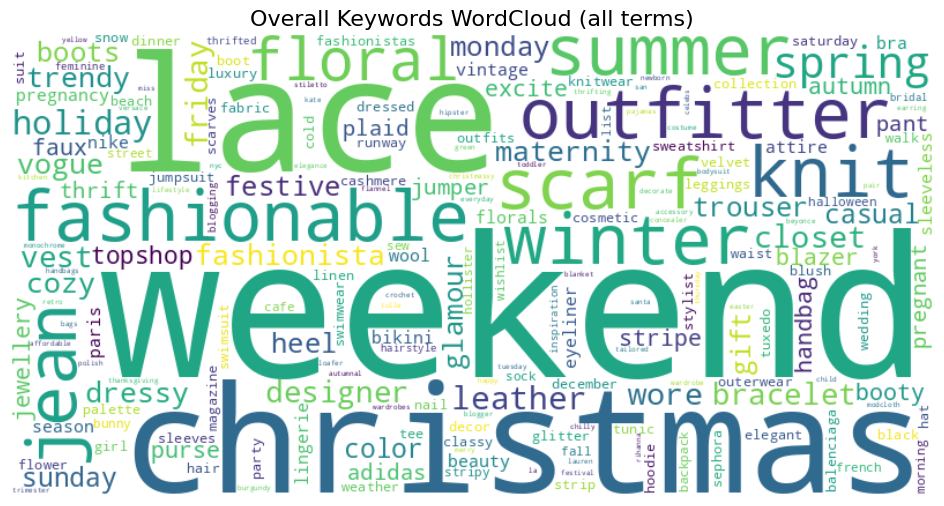

In [ ]:
# Flatten all keywords (excluding neutrals) into one big list
all_keywords = [
    kw
    for kws in df['kw_unigram']
    for kw in eval(kws)
    if kw not in neutral_words
]

# Count frequencies of every keyword
keyword_counts = Counter(all_keywords)

# Generate the WordCloud from the full frequency dict
wc = WordCloud(
    width=800,
    height=400,
    background_color='white',
    colormap='viridis',      # or any other cmap you prefer
    prefer_horizontal=0.9
).generate_from_frequencies(keyword_counts)

# Display
plt.figure(figsize=(12, 6))
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.title("Overall Keywords WordCloud (all terms)", fontsize=16)
plt.show()

## Bar Chart across brands

In [ ]:
brand_keywords = df.groupby('brand_name')['kw_unigram'].apply(
    lambda x: [kw for sublist in x for kw in eval(sublist) if kw not in neutral_words]
)

top_brand_keywords = brand_keywords.apply(lambda x: Counter(x).most_common(20))

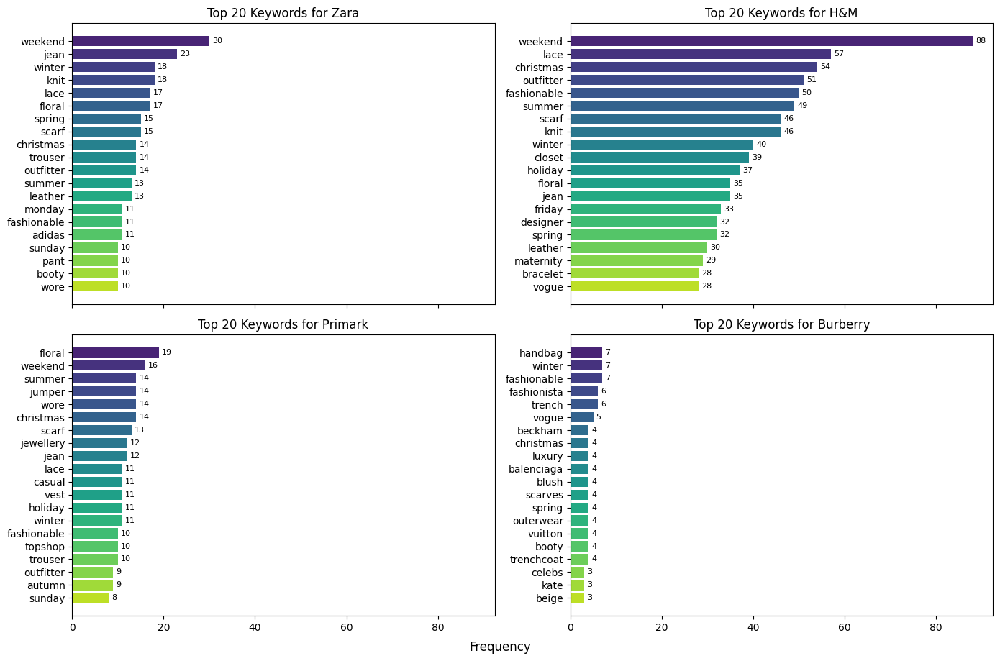

In [ ]:
# Rebuild brand_keywords with neutral words excluded:
brand_keywords = (
    df
    .groupby('brand_name')['kw_unigram']
    .apply(lambda series: [
        kw
        for kws in series
        for kw in eval(kws)
        if kw not in neutral_words
    ])
)

# Compute top-20 per brand
top_brand_keywords = brand_keywords.apply(lambda kw_list: Counter(kw_list).most_common(20))

brands = ['zara', 'h&m', 'primark', 'burberry']
display_names = {
    'zara':     'Zara',
    'h&m':      'H&M',
    'primark':  'Primark',
    'burberry': 'Burberry'
}

fig, axes = plt.subplots(2, 2, figsize=(14, 10), sharex=True)
axes = axes.flatten()
cmap = plt.get_cmap('viridis')

for ax, brand in zip(axes, brands):
    top20 = top_brand_keywords[brand]      # now already filtered
    labels, values = zip(*top20)

    colors = cmap(np.linspace(0.1, 0.9, len(labels)))
    bars = ax.barh(labels, values, color=colors)
    ax.bar_label(bars, labels=[str(v) for v in values], padding=3, fontsize=8)

    ax.set_title(f"Top 20 Keywords for {display_names[brand]}")
    ax.invert_yaxis()

fig.text(0.5, 0.04, 'Frequency', ha='center', fontsize=12)
plt.tight_layout(rect=[0, 0.05, 1, 0.95])
plt.show()


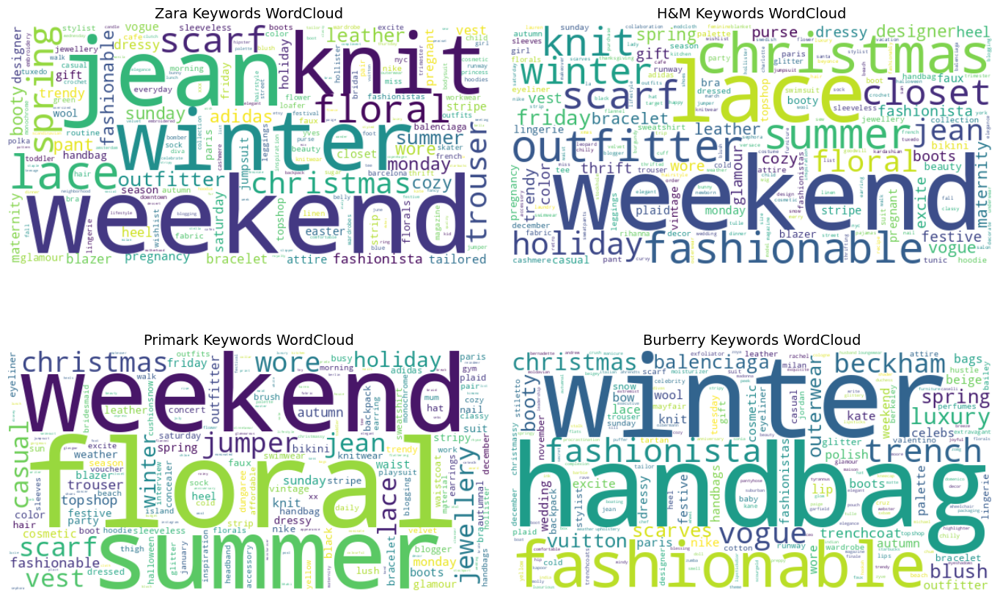

In [ ]:
brands  = ['zara', 'h&m', 'primark', 'burberry']
display = {'zara':'Zara','h&m':'H&M','primark':'Primark','burberry':'Burberry'}

fig, axes = plt.subplots(2, 2, figsize=(14, 10))
axes = axes.flatten()

for ax, brand in zip(axes, brands):
    # Gather this brand’s keywords (excluding neutrals)
    kws = (
        df.loc[df['brand_name']==brand, 'kw_unigram']
        .apply(eval)
        .explode()
        .tolist()
    )
    kws = [kw for kw in kws if kw not in neutral_words]

    # Count every keyword for this brand
    freq = Counter(kws)

    # Build wordcloud from full dict
    wc = WordCloud(
        width=600,
        height=300,
        background_color='white',
        colormap='viridis',
        prefer_horizontal=0.9
    ).generate_from_frequencies(freq)

    #  Plot on its axis
    ax.imshow(wc, interpolation='bilinear')
    ax.axis('off')
    ax.set_title(f"{display[brand]} Keywords WordCloud", fontsize=14)

plt.tight_layout(pad=2)
plt.show()


### Word Cloud Visuals

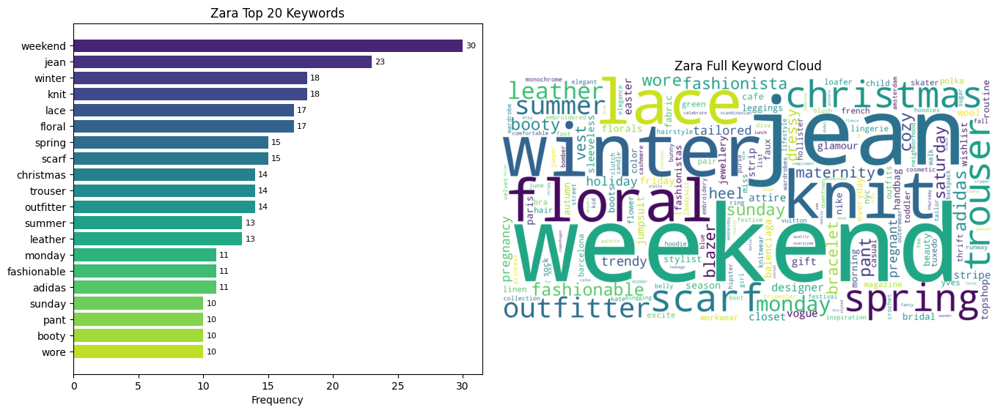

Saved /content/drive/MyDrive/pretrained_refinedweb_updated_shared/wordclouds_only_pos/zara_pos_high_conf_keywords.png


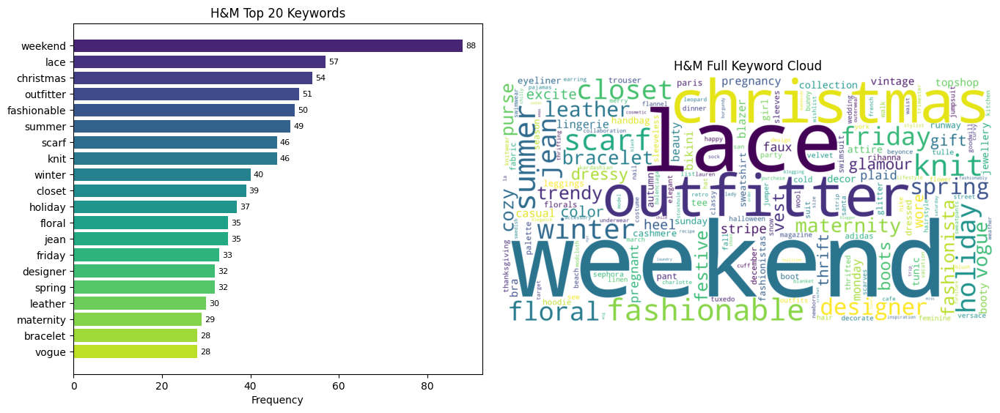

Saved /content/drive/MyDrive/pretrained_refinedweb_updated_shared/wordclouds_only_pos/h&m_pos_high_conf_keywords.png


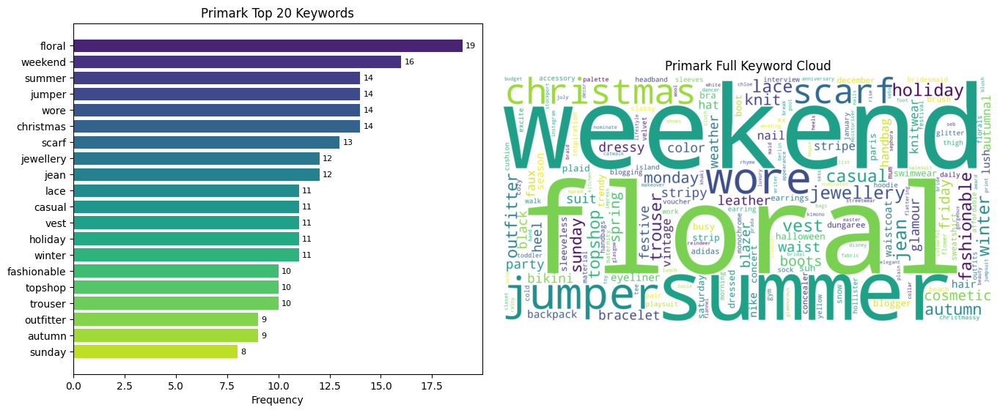

Saved /content/drive/MyDrive/pretrained_refinedweb_updated_shared/wordclouds_only_pos/primark_pos_high_conf_keywords.png


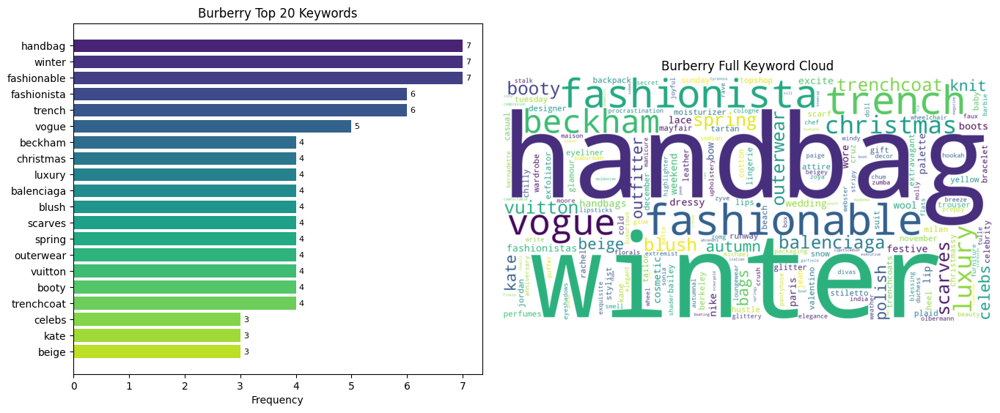

Saved /content/drive/MyDrive/pretrained_refinedweb_updated_shared/wordclouds_only_pos/burberry_pos_high_conf_keywords.png


In [ ]:
brands      = ['zara', 'h&m', 'primark', 'burberry']
display     = {'zara':'Zara','h&m':'H&M','primark':'Primark','burberry':'Burberry'}
neutral     = set(neutral_words)   # your neutral‐word list
output_path = Path("/content/drive/MyDrive/pretrained_refinedweb_updated_shared/wordclouds_only_pos")
output_path.mkdir(parents=True, exist_ok=True)

for brand in brands:
    # 1) gather & filter keywords
    kws = (
        df.loc[df['brand_name']==brand, 'kw_unigram']
          .apply(eval)
          .explode()
          .tolist()
    )
    kws = [kw for kw in kws if kw not in neutral]
    freq = Counter(kws)

    # 2) top-20 for bars
    top20 = freq.most_common(20)
    labels, values = zip(*top20)

    # 3) new figure with 1×2 layout
    fig, (ax_bar, ax_wc) = plt.subplots(1, 2, figsize=(14, 6),
                                        gridspec_kw={'width_ratios': [1,1.2]})

    # — Left: horizontal bar chart
    cmap = plt.get_cmap('viridis')
    colors = cmap(np.linspace(0.1, 0.9, len(values)))
    bars = ax_bar.barh(labels[::-1], values[::-1], color=colors[::-1])
    ax_bar.bar_label(bars, padding=3, fontsize=8)
    ax_bar.set_title(f"{display[brand]} Top 20 Keywords")
    ax_bar.set_xlabel("Frequency")

    # — Right: “spread‐out” wordcloud
    wc = WordCloud(
        width=800,
        height=400,
        background_color='white',
        colormap='viridis',
        max_words=200,
        scale=3,
        prefer_horizontal=0.5
    ).generate_from_frequencies(freq)

    ax_wc.imshow(wc, interpolation='bilinear')
    ax_wc.axis('off')
    ax_wc.set_title(f"{display[brand]} Full Keyword Cloud")

    plt.tight_layout(pad=2.0)

    # **Display inline**
    plt.show()

    # 4) save to PNG
    out_file = output_path / f"{display[brand].lower().replace(' ','_')}_pos_high_conf_keywords.png"
    fig.savefig(out_file, dpi=300, bbox_inches='tight')
    plt.close(fig)

    print(f"Saved {out_file}")


### Top 30 keywords as table

In [ ]:
from IPython.display import display
# Rebuild brand_keywords with neutral words excluded
brand_keywords = (
    df
    .groupby('brand_name')['kw_unigram']
    .apply(lambda series: [
        kw for kws in series for kw in eval(kws)
        if kw not in neutral_words
    ])
)

# 2) Decide which brands to show and how many keywords
brands        = ['zara', 'h&m', 'primark', 'burberry']
display_names = {
    'zara':     'Zara',
    'h&m':      'H&M',
    'primark':  'Primark',
    'burberry': 'Burberry'
}
top_n = 50

# 3) Build a dict of DataFrames, keyed by the original brand string
df_top_keywords = {}

for brand in brands:
    counts    = Counter(brand_keywords[brand]).most_common(top_n)
    df_brand  = pd.DataFrame(counts, columns=['Keyword', 'Count'])
    df_top_keywords[brand] = df_brand

# 4) (Optional) unpack into four variables if you need them by name
df_top_zara      = df_top_keywords['zara']
df_top_hm        = df_top_keywords['h&m']
df_top_primark  = df_top_keywords['primark']
df_top_burberry = df_top_keywords['burberry']

# 5) Display them all
for brand, tbl in df_top_keywords.items():
    print(f"\nTop {top_n} Keywords for {display_names[brand]}")
    display(tbl)



Top 50 Keywords for Zara


,Keyword,Count
0,weekend,30
1,jean,23
2,winter,18
3,knit,18
4,lace,17
5,floral,17
6,spring,15
7,scarf,15
8,christmas,14
9,trouser,14



Top 50 Keywords for H&M


,Keyword,Count
0,weekend,88
1,lace,57
2,christmas,54
3,outfitter,51
4,fashionable,50
5,summer,49
6,scarf,46
7,knit,46
8,winter,40
9,closet,39



Top 50 Keywords for Primark


,Keyword,Count
0,floral,19
1,weekend,16
2,summer,14
3,jumper,14
4,wore,14
5,christmas,14
6,scarf,13
7,jewellery,12
8,jean,12
9,lace,11



Top 50 Keywords for Burberry


,Keyword,Count
0,handbag,7
1,winter,7
2,fashionable,7
3,fashionista,6
4,trench,6
5,vogue,5
6,beckham,4
7,christmas,4
8,luxury,4
9,balenciaga,4


In [ ]:
# Rebuild brand_keywords with neutral words excluded
brand_keywords = (
    df
    .groupby('brand_name')['kw_unigram']
    .apply(lambda series: [
        kw
        for kws in series
        for kw in eval(kws)
        if kw not in neutral_words
    ])
)

# Specify brands and their display names
brands = ['zara', 'h&m', 'primark', 'burberry']
display_names = {
    'zara':     'Zara',
    'h&m':      'H&M',
    'primark':  'Primark',
    'burberry': 'Burberry'
}
top_n = 30

# Build a DataFrame of the top-n keywords for each brand
df_top_keywords = {}
for b in brands:
    counts = Counter(brand_keywords[b]).most_common(top_n)
    df_b   = pd.DataFrame(counts, columns=['keyword', 'count'])
    df_b['brand'] = display_names[b]
    df_top_keywords[b] = df_b

# Combine all brand DataFrames into one
df_all = pd.concat(df_top_keywords.values(), ignore_index=True)

# Pivot so each brand becomes its own column of counts
pivot_df = (
    df_all
    .pivot_table(
        index='keyword',
        columns='brand',
        values='count',
        fill_value=0
    )
    .reset_index()
)

# Select keywords present in all four brands
mask_all = (pivot_df[display_names[b]] > 0 for b in brands)
common_keywords = pivot_df.loc[
    pd.concat(mask_all, axis=1).all(axis=1)
].sort_values(by=[display_names[b] for b in brands], ascending=False)

# Select keywords present in exactly one brand
mask_any = (pivot_df[display_names[b]] > 0 for b in brands)
unique_keywords = pivot_df.loc[
    pd.concat(mask_any, axis=1).sum(axis=1) == 1
].sort_values(by=[display_names[b] for b in brands], ascending=False)

In [ ]:
# Render the two tables side-by-side for reporting
html = f"""
<div style="display:flex; gap:40px;">
  <div style="flex:1;">
    <h3>Common Keywords (All 4 Brands)</h3>
    {common_keywords.to_html(index=False)}
  </div>
  <div style="flex:1;">
    <h3>Unique Keywords (Exactly One Brand)</h3>
    {unique_keywords.to_html(index=False)}
  </div>
</div>
"""
display(HTML(html))

brand,keyword,Burberry,H&M,Primark,Zara
,knit,3.0,46.0,8.0,18.0
,winter,7.0,40.0,11.0,18.0
,spring,4.0,32.0,7.0,15.0
,christmas,4.0,54.0,14.0,14.0
,outfitter,3.0,51.0,9.0,14.0
,fashionable,7.0,50.0,10.0,11.0
brand,keyword,Burberry,H&M,Primark,Zara
,adidas,0.0,0.0,0.0,11.0
,pant,0.0,0.0,0.0,10.0
,heel,0.0,0.0,0.0,9.0


### Bar chart of common keyword (%)

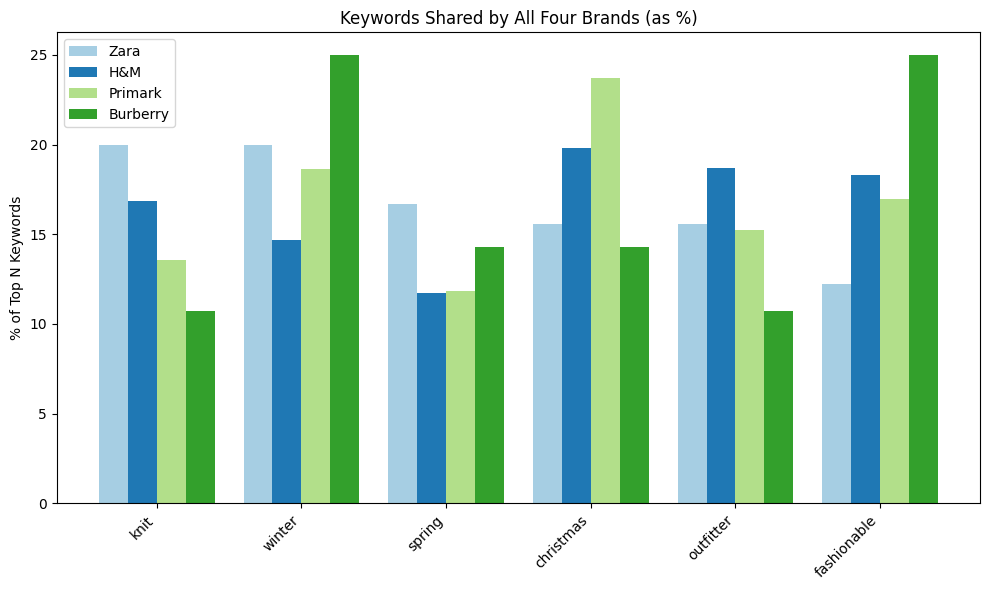

In [ ]:
# Pick up to K common keywords
K = 10
top_common = common_keywords.head(K).set_index('keyword')

# Brands & display names
brands = list(display_names.values())

# Build a (K × 4) matrix of percentages
pct_data = np.vstack([
    (top_common[brand] / top_common[brand].sum() * 100).values
    for brand in brands
]).T  # shape = (K, 4)

actual_K = pct_data.shape[0]

fig, ax = plt.subplots(figsize=(10, 6))

x     = np.arange(actual_K)
width = 0.8 / len(brands)

# use the Paired colormap (which has 12 distinct, formal-yet-vibrant colors)
cmap = plt.get_cmap('Paired')
colors = cmap.colors[:len(brands)]  # take as many as you need (4 here)

for i, (brand, color) in enumerate(zip(brands, colors)):
    ax.bar(x + i*width, pct_data[:, i], width, label=brand, color=color)

ax.set_xticks(x + width*(len(brands)-1)/2)
ax.set_xticklabels(top_common.index, rotation=45, ha='right')
ax.set_ylabel("% of Top N Keywords")
ax.set_title("Keywords Shared by All Four Brands (as %)")
ax.legend()

plt.tight_layout()
plt.show()


### Bar chart of unique keywords across brands

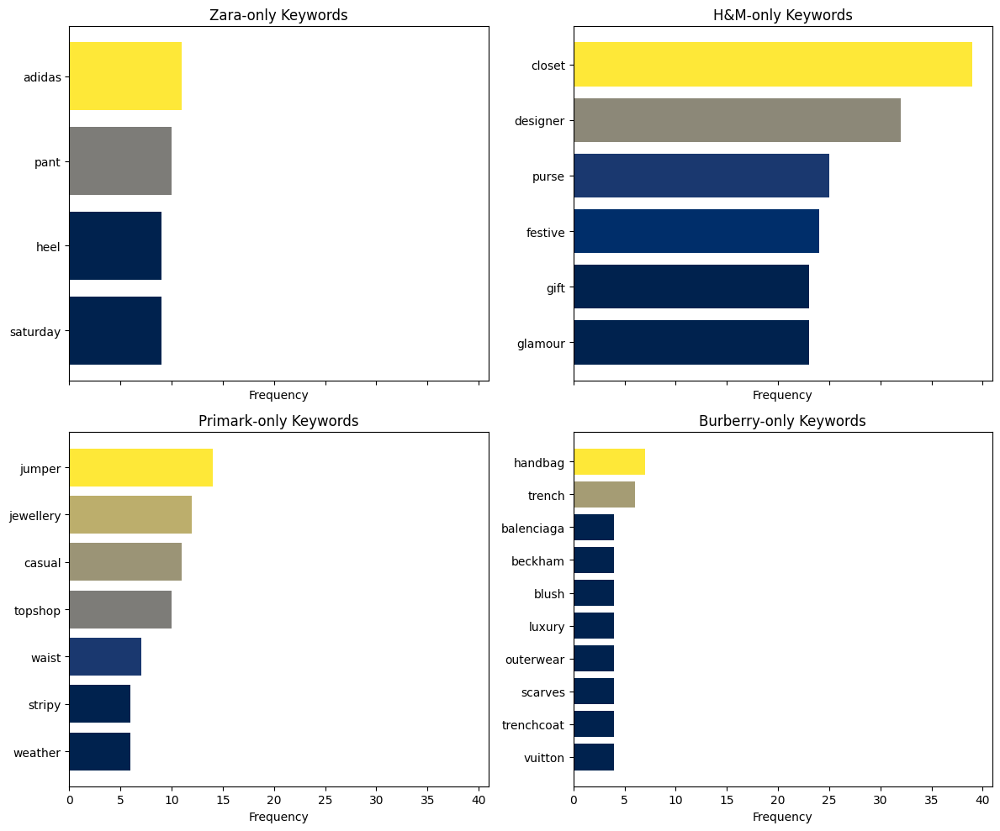

Saved /content/drive/MyDrive/pretrained_refinedweb_updated_shared/wordclouds_only_pos/burberry_pos_high_conf_unique_keywords_bigram.png


In [ ]:
# Output path for saving
output_path = Path("/content/drive/MyDrive/pretrained_refinedweb_updated_shared/wordclouds_only_pos")
output_path.mkdir(parents=True, exist_ok=True)

# Brand settings
brands = ['zara', 'h&m', 'primark', 'burberry']
display = {'zara': 'Zara', 'h&m': 'H&M', 'primark': 'Primark', 'burberry': 'Burberry'}
M = 10
cmap = plt.colormaps['cividis']  # For matplotlib >=3.7

# Create square layout (2x2)
fig, axes = plt.subplots(2, 2, figsize=(12, 10), sharex=True)
axes = axes.flatten()

# Plot for each brand
for ax, brand in zip(axes, brands):
    display_name = display[brand]

    uniq = unique_keywords[unique_keywords[display_name] > 0].nlargest(M, display_name)
    values = uniq[display_name].values

    norm = Normalize(vmin=values.min(), vmax=values.max())
    colors = cmap(norm(values))

    ax.barh(uniq['keyword'], values, color=colors)
    ax.invert_yaxis()
    ax.set_title(f"{display_name}-only Keywords")
    ax.set_xlabel("Frequency")

plt.tight_layout()

# Save the full 2x2 grid as one image
out_file = output_path / f"{display[brand].lower().replace(' ','_')}_pos_high_conf_unique_keywords_bigram.png"
fig.savefig(out_file, dpi=300, bbox_inches='tight')

# Show inline
plt.show()
plt.close(fig)

print(f"Saved {out_file}")

## Heatmap of Common Top Keywords

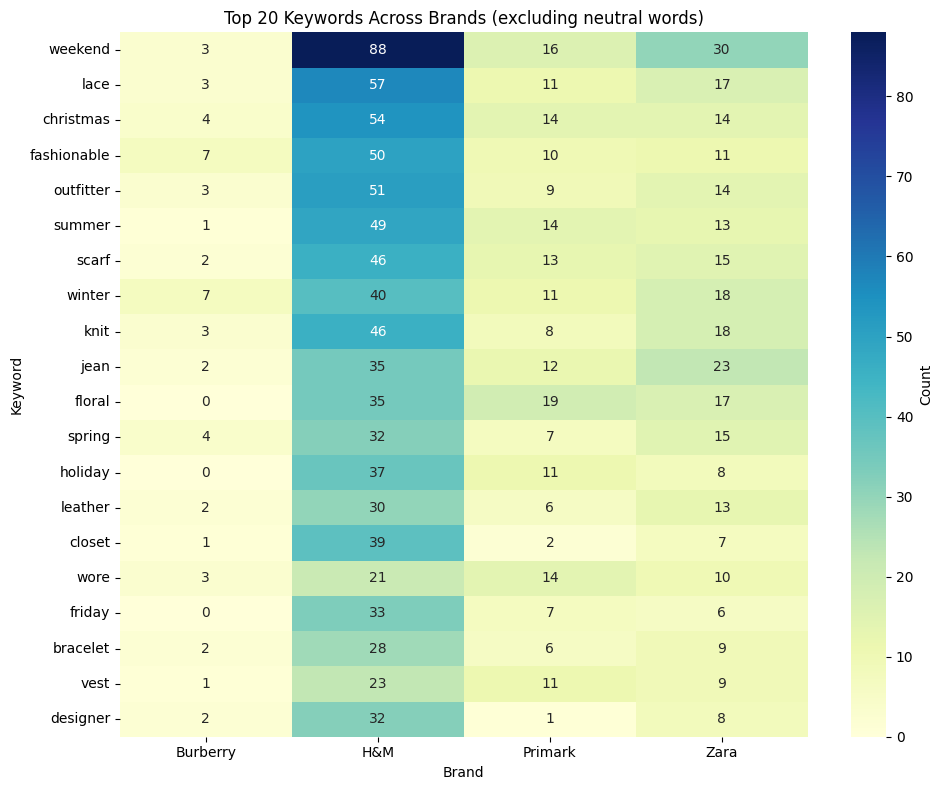

In [ ]:
# Build long-form DataFrame
rows = []
for key, kws in brand_keywords.items():
    label = display_names.get(key, key)
    for kw, cnt in Counter(kws).items():
        if kw not in neutral_words:
            rows.append((label, kw, cnt))
df = pd.DataFrame(rows, columns=['brand', 'keyword', 'count'])

# Pivot to matrix
pivot = df.pivot_table(
    index='keyword',
    columns='brand',
    values='count',
    fill_value=0
)

# Keep only top 20 keywords
top20 = pivot.sum(axis=1).nlargest(20).index
pivot = pivot.loc[top20]

# Plot heatmap with a smooth sequential palette
plt.figure(figsize=(10, 8))
sns.heatmap(
    pivot,
    annot=True,
    fmt=".0f",         # integer‐style formatting
    cmap="YlGnBu",     # smooth yellow→green→blue
    cbar_kws={'label': 'Count'}
)
plt.title("Top 20 Keywords Across Brands (excluding neutral words)")
plt.ylabel("Keyword")
plt.xlabel("Brand")
plt.tight_layout()
plt.show()

## Uni-bigram

### Overall top keyword - Bar chart

In [ ]:
# Load the data
output_path = Path("/content/drive/MyDrive/pretrained_refinedweb_updated_shared/pos_high_conf_nlp-added-features-bi.csv")
df = pd.read_csv(output_path)

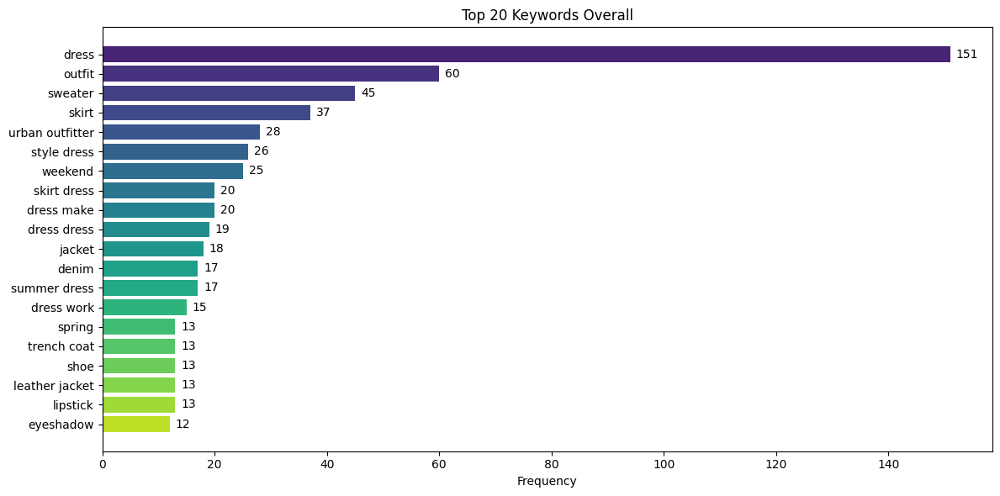

In [ ]:
all_keywords = [kw for kws in df['kw_uni_bi'] for kw in eval(kws)]
keyword_counts = Counter(all_keywords)
top_keywords = keyword_counts.most_common(20)
labels, values = zip(*top_keywords)

cmap = plt.get_cmap('viridis')                      # or 'plasma', 'cividis', etc.
colors = cmap(np.linspace(0.1, 0.9, len(labels)))   # avoid extremes of the colormap

fig, ax = plt.subplots(figsize=(12, 6))
bars = ax.barh(labels[::-1], values[::-1], color=colors[::-1])

ax.bar_label(bars, labels=[f"{v}" for v in values[::-1]], padding=5, fontsize=10)

ax.set_title("Top 20 Keywords Overall")
ax.set_xlabel("Frequency")
plt.tight_layout()
plt.show()

###  Overall top keyword - Bar chart (Filtering out of neutral keyword of fashion product)

We fixed the same neutral_keyword since unigram analysis

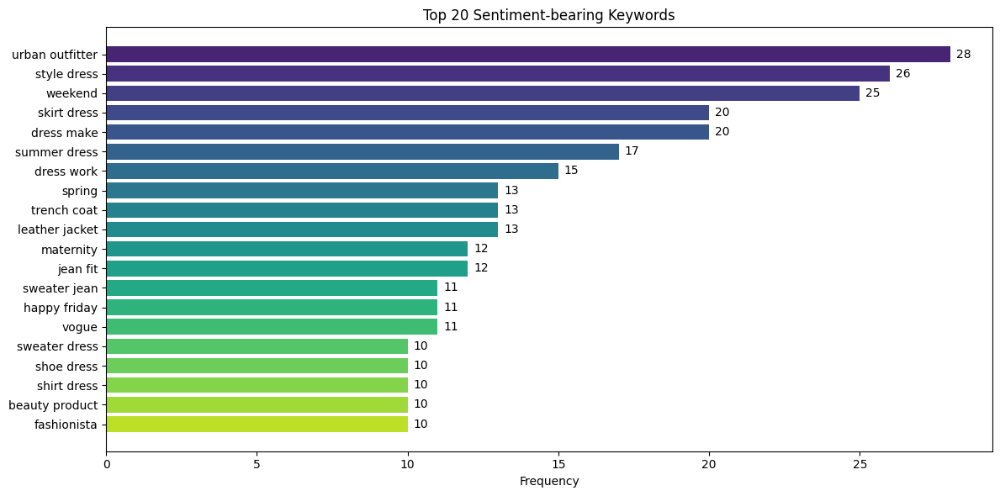

In [ ]:
all_keywords = [
    kw
    for kws in df['kw_uni_bi']
    for kw in eval(kws)
    if kw not in neutral_words
]

keyword_counts = Counter(all_keywords)
top_keywords = keyword_counts.most_common(20)
labels, values = zip(*top_keywords)

cmap = plt.get_cmap('viridis')
colors = cmap(np.linspace(0.1, 0.9, len(labels)))

fig, ax = plt.subplots(figsize=(12, 6))
bars = ax.barh(labels[::-1], values[::-1], color=colors[::-1])
ax.bar_label(bars, labels=[f"{v}" for v in values[::-1]], padding=5, fontsize=10)

ax.set_title("Top 20 Sentiment‐bearing Keywords")
ax.set_xlabel("Frequency")
plt.tight_layout()
plt.show()


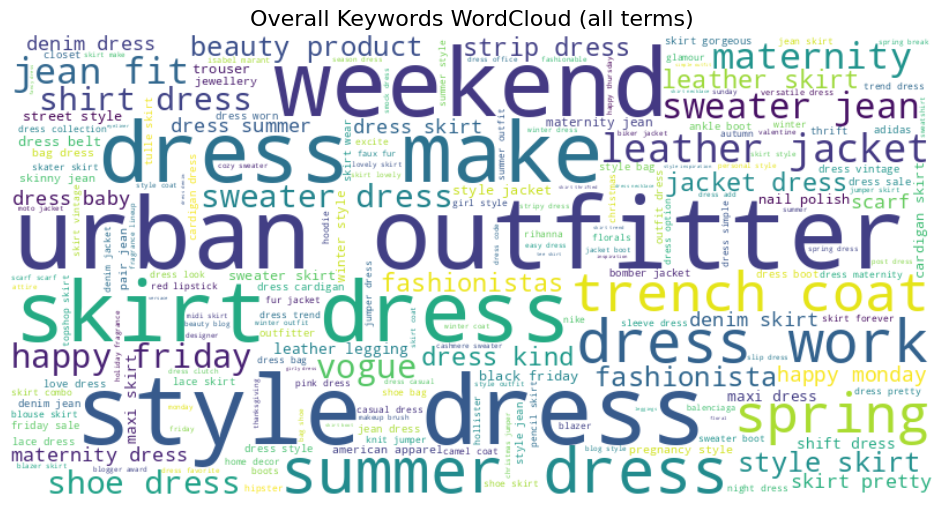

In [ ]:
# Flatten all keywords (excluding neutrals) into one big list
all_keywords = [
    kw
    for kws in df['kw_uni_bi']
    for kw in eval(kws)
    if kw not in neutral_words
]

# Count frequencies of every keyword
keyword_counts = Counter(all_keywords)

# Generate the WordCloud from the full frequency dict
wc = WordCloud(
    width=800,
    height=400,
    background_color='white',
    colormap='viridis',      # or any other cmap you prefer
    prefer_horizontal=0.9
).generate_from_frequencies(keyword_counts)

# Display
plt.figure(figsize=(12, 6))
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.title("Overall Keywords WordCloud (all terms)", fontsize=16)
plt.show()

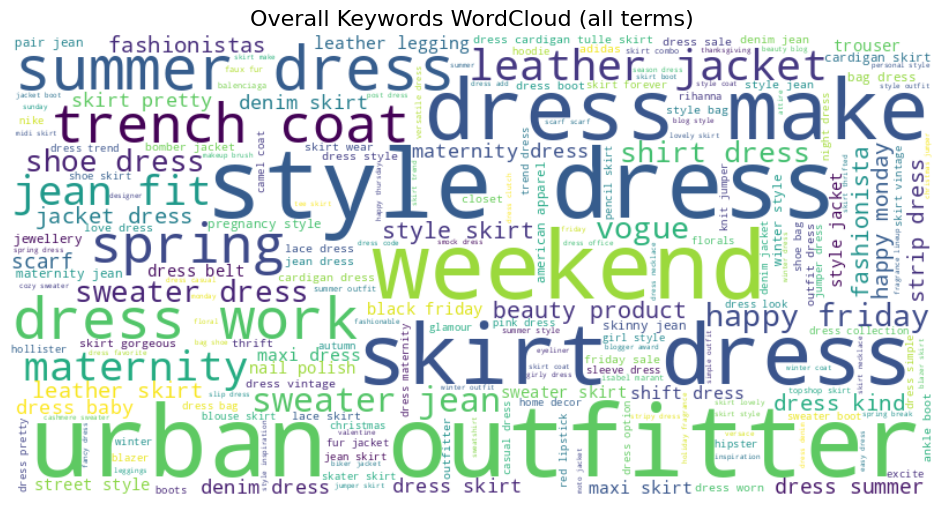

In [ ]:
# Flatten all keywords (excluding neutrals) into one big list
all_keywords = [
    kw
    for kws in df['kw_uni_bi']
    for kw in eval(kws)
    if kw not in neutral_words
]

# Count frequencies of every keyword
keyword_counts = Counter(all_keywords)

# Generate the WordCloud from the full frequency dict
wc = WordCloud(
    width=800,
    height=400,
    background_color='white',
    colormap='viridis',      # or any other cmap you prefer
    prefer_horizontal=0.9
).generate_from_frequencies(keyword_counts)

# Display
plt.figure(figsize=(12, 6))
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.title("Overall Keywords WordCloud (all terms)", fontsize=16)
plt.show()

## Bar Chart across brands

In [ ]:
brand_keywords = df.groupby('brand_name')['kw_uni_bi'].apply(
    lambda x: [kw for sublist in x for kw in eval(sublist) if kw not in neutral_words]
)

top_brand_keywords = brand_keywords.apply(lambda x: Counter(x).most_common(20))

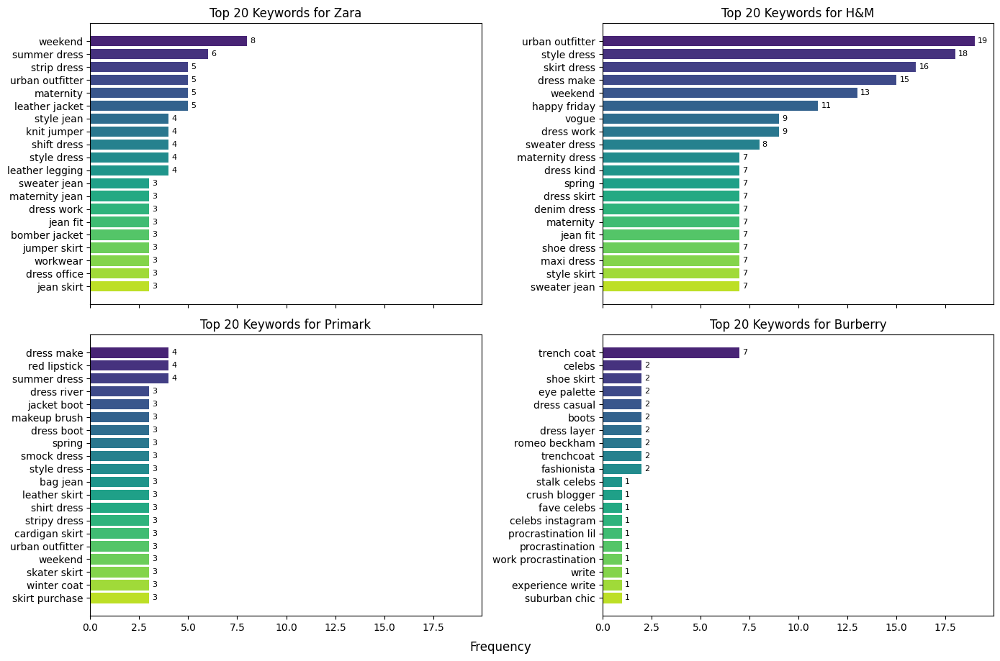

In [ ]:
# Rebuild brand_keywords with neutral words excluded:
brand_keywords = (
    df
    .groupby('brand_name')['kw_uni_bi']
    .apply(lambda series: [
        kw
        for kws in series
        for kw in eval(kws)
        if kw not in neutral_words
    ])
)

# Compute top-20 per brand
top_brand_keywords = brand_keywords.apply(lambda kw_list: Counter(kw_list).most_common(20))

brands = ['zara', 'h&m', 'primark', 'burberry']
display_names = {
    'zara':     'Zara',
    'h&m':      'H&M',
    'primark':  'Primark',
    'burberry': 'Burberry'
}

fig, axes = plt.subplots(2, 2, figsize=(14, 10), sharex=True)
axes = axes.flatten()
cmap = plt.get_cmap('viridis')

for ax, brand in zip(axes, brands):
    top20 = top_brand_keywords[brand]      # now already filtered
    labels, values = zip(*top20)

    colors = cmap(np.linspace(0.1, 0.9, len(labels)))
    bars = ax.barh(labels, values, color=colors)
    ax.bar_label(bars, labels=[str(v) for v in values], padding=3, fontsize=8)

    ax.set_title(f"Top 20 Keywords for {display_names[brand]}")
    ax.invert_yaxis()

fig.text(0.5, 0.04, 'Frequency', ha='center', fontsize=12)
plt.tight_layout(rect=[0, 0.05, 1, 0.95])
plt.show()

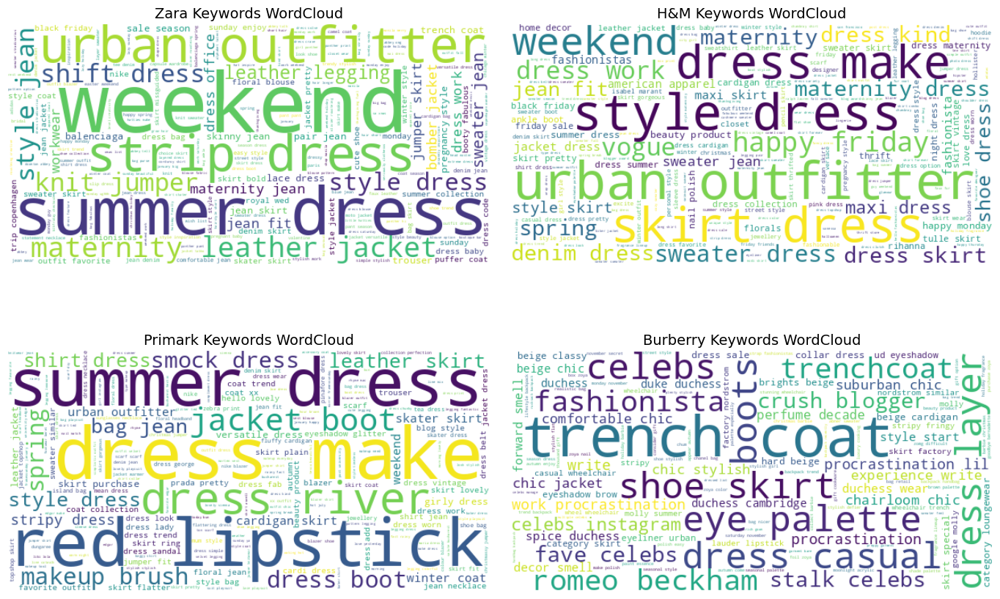

In [ ]:
brands  = ['zara', 'h&m', 'primark', 'burberry']
display = {'zara':'Zara','h&m':'H&M','primark':'Primark','burberry':'Burberry'}

fig, axes = plt.subplots(2, 2, figsize=(14, 10))
axes = axes.flatten()

for ax, brand in zip(axes, brands):
    # Gather this brand’s keywords (excluding neutrals)
    kws = (
        df.loc[df['brand_name']==brand, 'kw_uni_bi']
        .apply(eval)
        .explode()
        .tolist()
    )
    kws = [kw for kw in kws if kw not in neutral_words]

    # Count every keyword for this brand
    freq = Counter(kws)

    # Build wordcloud from full dict
    wc = WordCloud(
        width=600,
        height=300,
        background_color='white',
        colormap='viridis',
        prefer_horizontal=0.9
    ).generate_from_frequencies(freq)

    #  Plot on its axis
    ax.imshow(wc, interpolation='bilinear')
    ax.axis('off')
    ax.set_title(f"{display[brand]} Keywords WordCloud", fontsize=14)

plt.tight_layout(pad=2)
plt.show()

### Word Cloud Visuals

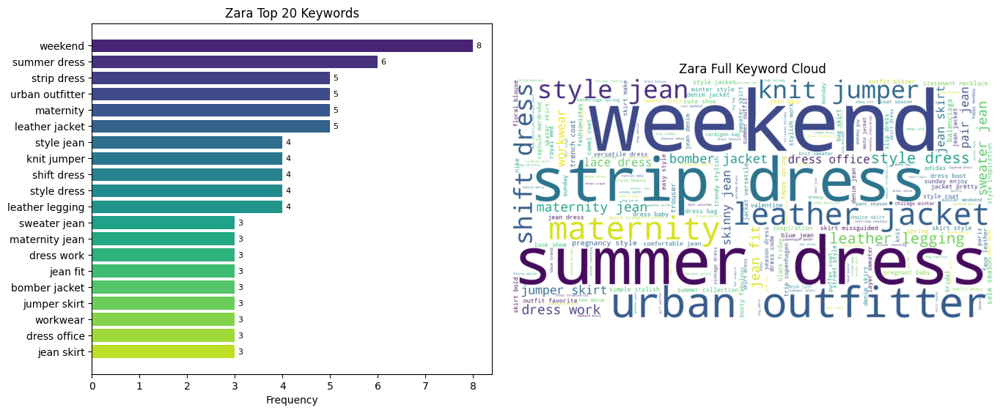

Saved /content/drive/MyDrive/pretrained_refinedweb_updated_shared/wordclouds_only_pos/zara_pos_high_conf_keywords_uni_bi.png


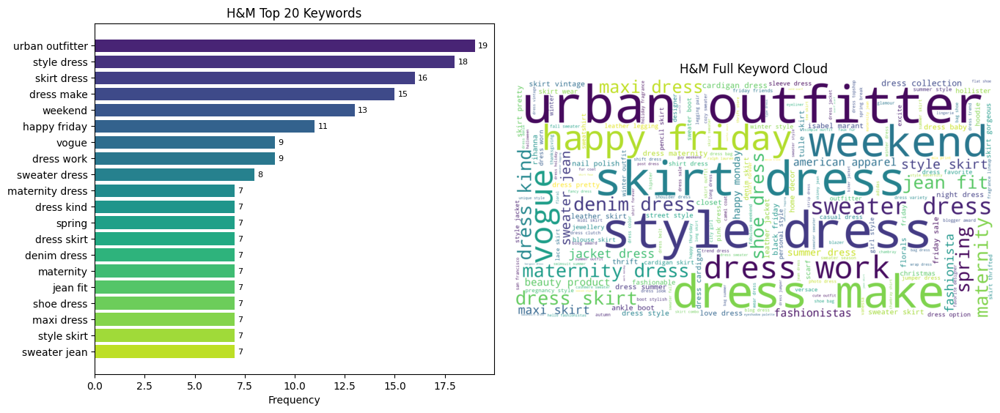

Saved /content/drive/MyDrive/pretrained_refinedweb_updated_shared/wordclouds_only_pos/h&m_pos_high_conf_keywords_uni_bi.png


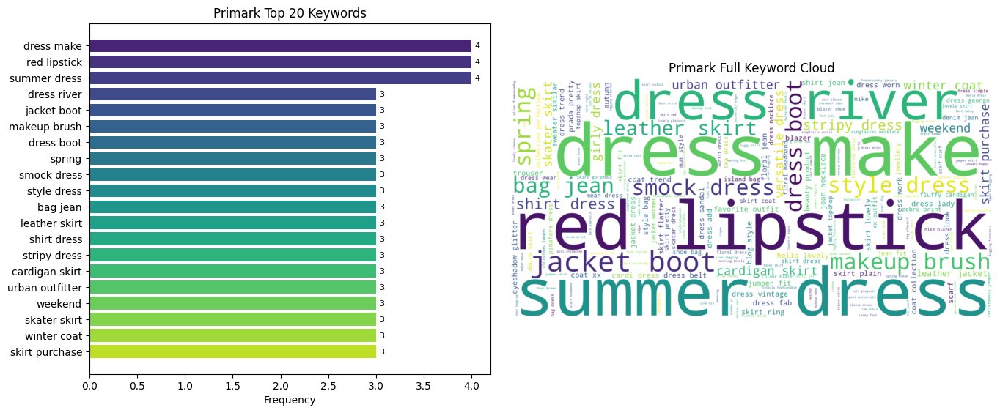

Saved /content/drive/MyDrive/pretrained_refinedweb_updated_shared/wordclouds_only_pos/primark_pos_high_conf_keywords_uni_bi.png


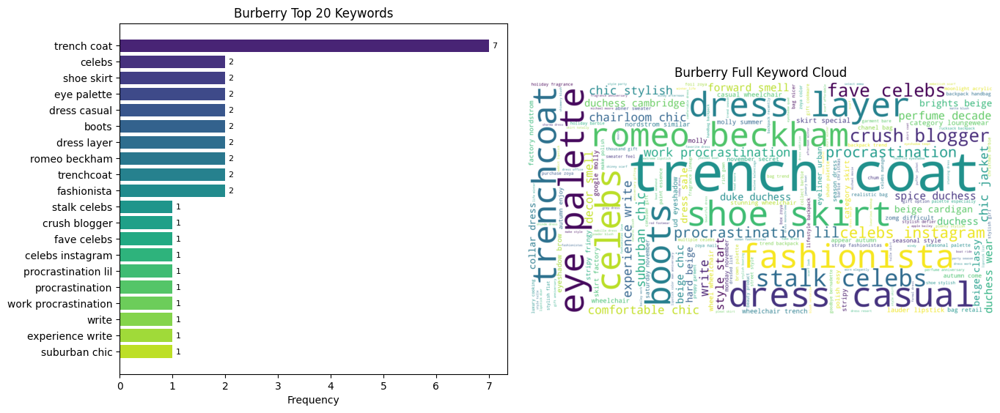

Saved /content/drive/MyDrive/pretrained_refinedweb_updated_shared/wordclouds_only_pos/burberry_pos_high_conf_keywords_uni_bi.png


In [ ]:
from IPython.display import display
brands      = ['zara', 'h&m', 'primark', 'burberry']
display     = {'zara':'Zara','h&m':'H&M','primark':'Primark','burberry':'Burberry'}
neutral     = set(neutral_words)   # your neutral‐word list
output_path = Path("/content/drive/MyDrive/pretrained_refinedweb_updated_shared/wordclouds_only_pos")
output_path.mkdir(parents=True, exist_ok=True)

for brand in brands:
    # 1) gather & filter keywords
    kws = (
        df.loc[df['brand_name']==brand, 'kw_uni_bi']
          .apply(eval)
          .explode()
          .tolist()
    )
    kws = [kw for kw in kws if kw not in neutral]
    freq = Counter(kws)

    # 2) top-20 for bars
    top20 = freq.most_common(20)
    labels, values = zip(*top20)

    # 3) new figure with 1×2 layout
    fig, (ax_bar, ax_wc) = plt.subplots(1, 2, figsize=(14, 6),
                                        gridspec_kw={'width_ratios': [1,1.2]})

    # — Left: horizontal bar chart
    cmap = plt.get_cmap('viridis')
    colors = cmap(np.linspace(0.1, 0.9, len(values)))
    bars = ax_bar.barh(labels[::-1], values[::-1], color=colors[::-1])
    ax_bar.bar_label(bars, padding=3, fontsize=8)
    ax_bar.set_title(f"{display[brand]} Top 20 Keywords")
    ax_bar.set_xlabel("Frequency")

    # — Right: “spread‐out” wordcloud
    wc = WordCloud(
        width=800,
        height=400,
        background_color='white',
        colormap='viridis',
        max_words=200,
        scale=3,
        prefer_horizontal=0.5
    ).generate_from_frequencies(freq)

    ax_wc.imshow(wc, interpolation='bilinear')
    ax_wc.axis('off')
    ax_wc.set_title(f"{display[brand]} Full Keyword Cloud")

    plt.tight_layout(pad=2.0)

    # **Display inline**
    plt.show()

    # 4) save to PNG
    out_file = output_path / f"{display[brand].lower().replace(' ','_')}_pos_high_conf_keywords_uni_bi.png"
    fig.savefig(out_file, dpi=300, bbox_inches='tight')
    plt.close(fig)

    print(f"Saved {out_file}")


### Top 30 keywords as table

In [ ]:
from IPython.display import display
# Rebuild brand_keywords with neutral words excluded
brand_keywords = (
    df
    .groupby('brand_name')['kw_uni_bi']
    .apply(lambda series: [
        kw for kws in series for kw in eval(kws)
        if kw not in neutral_words
    ])
)

# 2) Decide which brands to show and how many keywords
brands        = ['zara', 'h&m', 'primark', 'burberry']
display_names = {
    'zara':     'Zara',
    'h&m':      'H&M',
    'primark':  'Primark',
    'burberry': 'Burberry'
}
top_n = 50

# 3) Build a dict of DataFrames, keyed by the original brand string
df_top_keywords = {}

for brand in brands:
    counts    = Counter(brand_keywords[brand]).most_common(top_n)
    df_brand  = pd.DataFrame(counts, columns=['Keyword', 'Count'])
    df_top_keywords[brand] = df_brand

# 4) (Optional) unpack into four variables if you need them by name
df_top_zara      = df_top_keywords['zara']
df_top_hm        = df_top_keywords['h&m']
df_top_primark  = df_top_keywords['primark']
df_top_burberry = df_top_keywords['burberry']

# 5) Display them all
for brand, tbl in df_top_keywords.items():
    print(f"\nTop {top_n} Keywords for {display_names[brand]}")
    display(tbl)



Top 50 Keywords for Zara


,Keyword,Count
0,weekend,8
1,summer dress,6
2,strip dress,5
3,urban outfitter,5
4,maternity,5
5,leather jacket,5
6,style jean,4
7,knit jumper,4
8,shift dress,4
9,style dress,4



Top 50 Keywords for H&M


,Keyword,Count
0,urban outfitter,19
1,style dress,18
2,skirt dress,16
3,dress make,15
4,weekend,13
5,happy friday,11
6,vogue,9
7,dress work,9
8,sweater dress,8
9,maternity dress,7



Top 50 Keywords for Primark


,Keyword,Count
0,dress make,4
1,red lipstick,4
2,summer dress,4
3,dress river,3
4,jacket boot,3
5,makeup brush,3
6,dress boot,3
7,spring,3
8,smock dress,3
9,style dress,3



Top 50 Keywords for Burberry


,Keyword,Count
0,trench coat,7
1,celebs,2
2,shoe skirt,2
3,eye palette,2
4,dress casual,2
5,boots,2
6,dress layer,2
7,romeo beckham,2
8,trenchcoat,2
9,fashionista,2


In [ ]:
# Rebuild brand_keywords with neutral words excluded
brand_keywords = (
    df
    .groupby('brand_name')['kw_uni_bi']
    .apply(lambda series: [
        kw
        for kws in series
        for kw in eval(kws)
        if kw not in neutral_words
    ])
)

# Specify brands and their display names
brands = ['zara', 'h&m', 'primark', 'burberry']
display_names = {
    'zara':     'Zara',
    'h&m':      'H&M',
    'primark':  'Primark',
    'burberry': 'Burberry'
}
top_n = 30

# Build a DataFrame of the top-n keywords for each brand
df_top_keywords = {}
for b in brands:
    counts = Counter(brand_keywords[b]).most_common(top_n)
    df_b   = pd.DataFrame(counts, columns=['keyword', 'count'])
    df_b['brand'] = display_names[b]
    df_top_keywords[b] = df_b

# Combine all brand DataFrames into one
df_all = pd.concat(df_top_keywords.values(), ignore_index=True)

# Pivot so each brand becomes its own column of counts
pivot_df = (
    df_all
    .pivot_table(
        index='keyword',
        columns='brand',
        values='count',
        fill_value=0
    )
    .reset_index()
)

# Select keywords present in all four brands
mask_all = (pivot_df[display_names[b]] > 0 for b in brands)
common_keywords = pivot_df.loc[
    pd.concat(mask_all, axis=1).all(axis=1)
].sort_values(by=[display_names[b] for b in brands], ascending=False)

# Select keywords present in exactly one brand
mask_any = (pivot_df[display_names[b]] > 0 for b in brands)
unique_keywords = pivot_df.loc[
    pd.concat(mask_any, axis=1).sum(axis=1) == 1
].sort_values(by=[display_names[b] for b in brands], ascending=False)

In [ ]:
# Render the two tables side-by-side for reporting
html = f"""
<div style="display:flex; gap:40px;">
  <div style="flex:1;">
    <h3>Common Keywords (All 4 Brands)</h3>
    {common_keywords.to_html(index=False)}
  </div>
  <div style="flex:1;">
    <h3>Unique Keywords (Exactly One Brand)</h3>
    {unique_keywords.to_html(index=False)}
  </div>
</div>
"""
display(HTML(html))

brand,keyword,Burberry,H&M,Primark,Zara
brand,keyword,Burberry,H&M,Primark,Zara
,strip dress,0.0,0.0,0.0,5.0
,knit jumper,0.0,0.0,0.0,4.0
,leather legging,0.0,0.0,0.0,4.0
,shift dress,0.0,0.0,0.0,4.0
,style jean,0.0,0.0,0.0,4.0
,balenciaga,0.0,0.0,0.0,3.0
,bomber jacket,0.0,0.0,0.0,3.0
,dress office,0.0,0.0,0.0,3.0
,jean skirt,0.0,0.0,0.0,3.0


### Bar chart of common keyword (%)

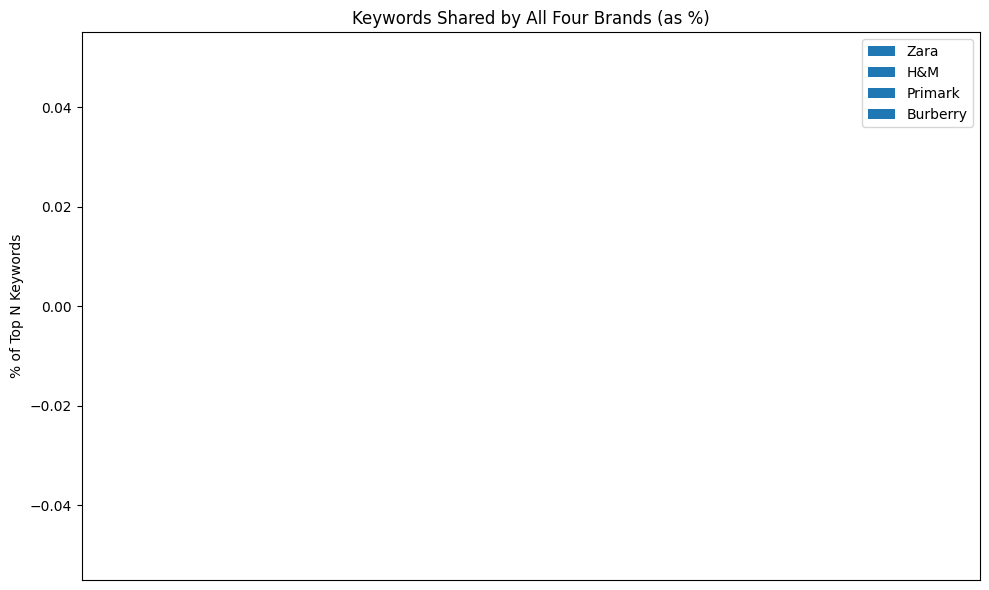

In [ ]:
# Pick up to K common keywords
K = 10
top_common = common_keywords.head(K).set_index('keyword')

# Brands & display names
brands = list(display_names.values())

# Build a (K × 4) matrix of percentages
pct_data = np.vstack([
    (top_common[brand] / top_common[brand].sum() * 100).values
    for brand in brands
]).T  # shape = (K, 4)

actual_K = pct_data.shape[0]

fig, ax = plt.subplots(figsize=(10, 6))

x     = np.arange(actual_K)
width = 0.8 / len(brands)

# use the Paired colormap (which has 12 distinct, formal-yet-vibrant colors)
cmap = plt.get_cmap('Paired')
colors = cmap.colors[:len(brands)]  # take as many as you need (4 here)

for i, (brand, color) in enumerate(zip(brands, colors)):
    ax.bar(x + i*width, pct_data[:, i], width, label=brand, color=color)

ax.set_xticks(x + width*(len(brands)-1)/2)
ax.set_xticklabels(top_common.index, rotation=45, ha='right')
ax.set_ylabel("% of Top N Keywords")
ax.set_title("Keywords Shared by All Four Brands (as %)")
ax.legend()

plt.tight_layout()
plt.show()

No keyword shares for all 4 brands

### Bar chart of unique keywords across brands

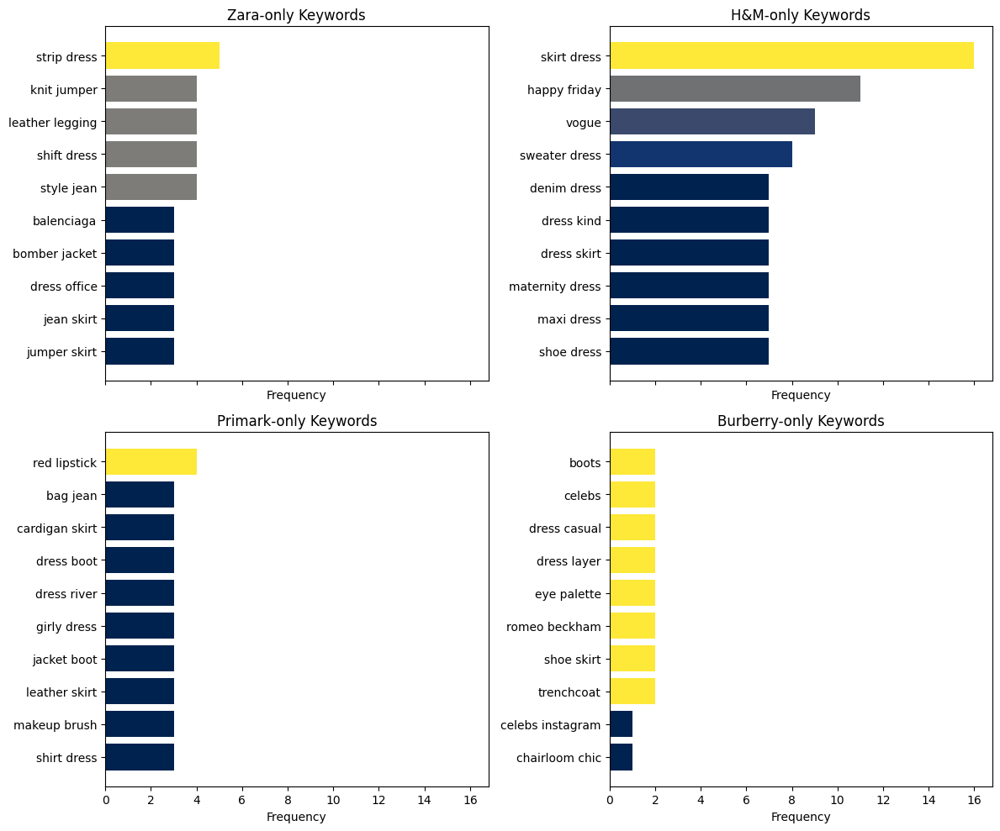

Saved /content/drive/MyDrive/pretrained_refinedweb_updated_shared/wordclouds_only_pos/burberry_pos_high_conf_unique_keywords_bigram.png


In [ ]:
# Output path for saving
output_path = Path("/content/drive/MyDrive/pretrained_refinedweb_updated_shared/wordclouds_only_pos")
output_path.mkdir(parents=True, exist_ok=True)

# Brand settings
brands = ['zara', 'h&m', 'primark', 'burberry']
display = {'zara': 'Zara', 'h&m': 'H&M', 'primark': 'Primark', 'burberry': 'Burberry'}
M = 10
cmap = plt.colormaps['cividis']  # For matplotlib >=3.7

# Create square layout (2x2)
fig, axes = plt.subplots(2, 2, figsize=(12, 10), sharex=True)
axes = axes.flatten()

# Plot for each brand
for ax, brand in zip(axes, brands):
    display_name = display[brand]

    uniq = unique_keywords[unique_keywords[display_name] > 0].nlargest(M, display_name)
    values = uniq[display_name].values

    norm = Normalize(vmin=values.min(), vmax=values.max())
    colors = cmap(norm(values))

    ax.barh(uniq['keyword'], values, color=colors)
    ax.invert_yaxis()
    ax.set_title(f"{display_name}-only Keywords")
    ax.set_xlabel("Frequency")

plt.tight_layout()

# Save the full 2x2 grid as one image
out_file = output_path / f"{display[brand].lower().replace(' ','_')}_pos_high_conf_unique_keywords_bigram.png"
fig.savefig(out_file, dpi=300, bbox_inches='tight')

# Show inline
plt.show()
plt.close(fig)

print(f"Saved {out_file}")


## Heatmap of Common Top Keywords

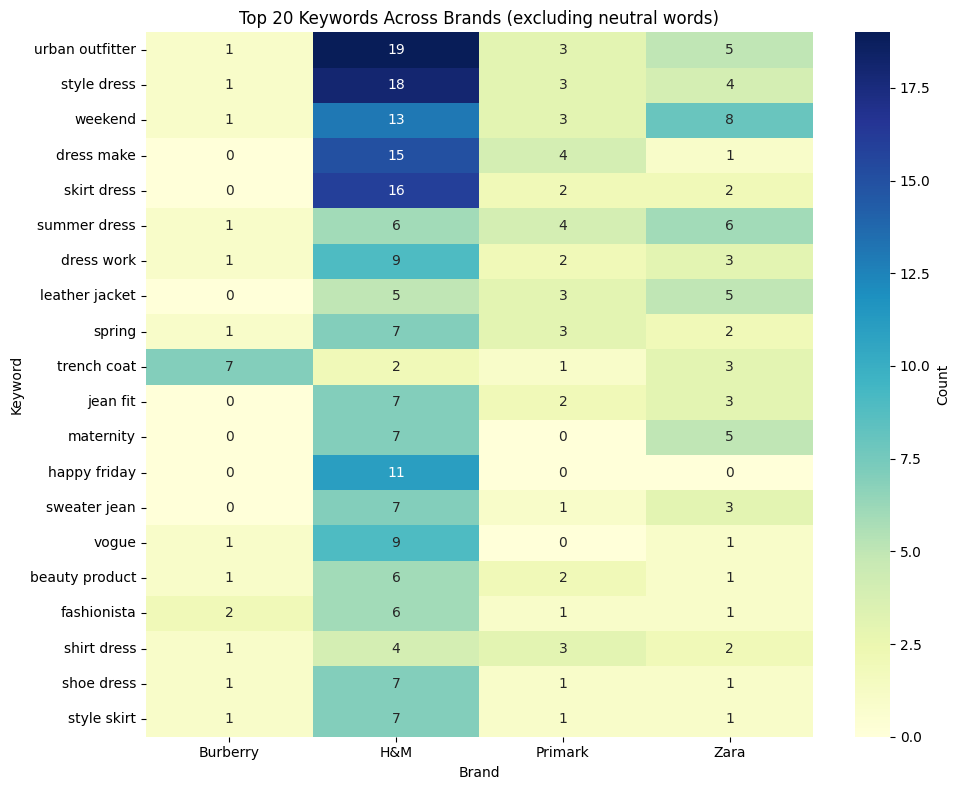

In [ ]:
# Build long-form DataFrame
rows = []
for key, kws in brand_keywords.items():
    label = display_names.get(key, key)
    for kw, cnt in Counter(kws).items():
        if kw not in neutral_words:
            rows.append((label, kw, cnt))
df = pd.DataFrame(rows, columns=['brand', 'keyword', 'count'])

# Pivot to matrix
pivot = df.pivot_table(
    index='keyword',
    columns='brand',
    values='count',
    fill_value=0
)

# Keep only top 20 keywords
top20 = pivot.sum(axis=1).nlargest(20).index
pivot = pivot.loc[top20]

# Plot heatmap with a smooth sequential palette
plt.figure(figsize=(10, 8))
sns.heatmap(
    pivot,
    annot=True,
    fmt=".0f",         # integer‐style formatting
    cmap="YlGnBu",     # smooth yellow→green→blue
    cbar_kws={'label': 'Count'}
)
plt.title("Top 20 Keywords Across Brands (excluding neutral words)")
plt.ylabel("Keyword")
plt.xlabel("Brand")
plt.tight_layout()
plt.show()

## Bigram

### Overall top keyword - Bar chart

In [ ]:
# Load the data
output_path = Path("/content/drive/MyDrive/pretrained_refinedweb_updated_shared/pos_high_conf_nlp-added-features-bi.csv")
df = pd.read_csv(output_path)

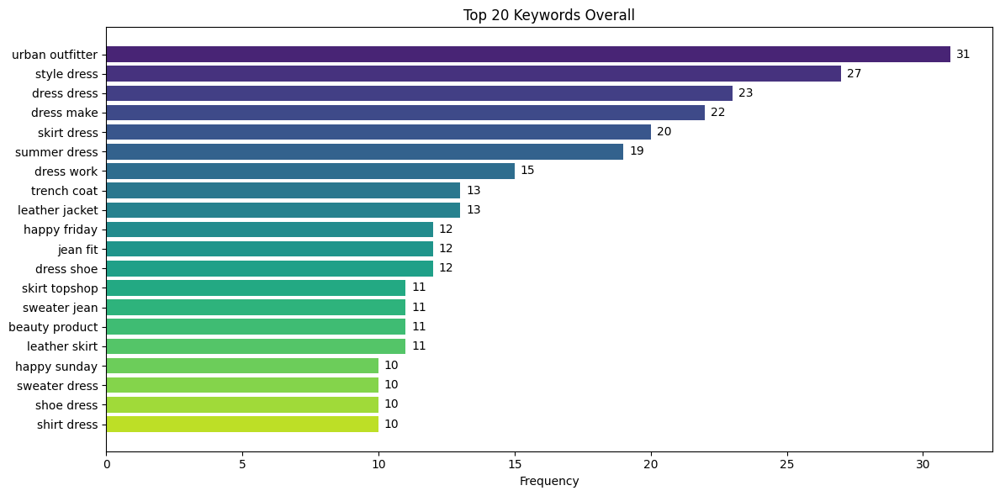

In [ ]:
all_keywords = [kw for kws in df['kw_bigram'] for kw in eval(kws)]
keyword_counts = Counter(all_keywords)
top_keywords = keyword_counts.most_common(20)
labels, values = zip(*top_keywords)

cmap = plt.get_cmap('viridis')                      # or 'plasma', 'cividis', etc.
colors = cmap(np.linspace(0.1, 0.9, len(labels)))   # avoid extremes of the colormap

fig, ax = plt.subplots(figsize=(12, 6))
bars = ax.barh(labels[::-1], values[::-1], color=colors[::-1])

ax.bar_label(bars, labels=[f"{v}" for v in values[::-1]], padding=5, fontsize=10)

ax.set_title("Top 20 Keywords Overall")
ax.set_xlabel("Frequency")
plt.tight_layout()
plt.show()

###  Overall top keyword - Bar chart (Filtering out of neutral keyword of fashion product)

We fixed the same neutral_keyword since unigram analysis

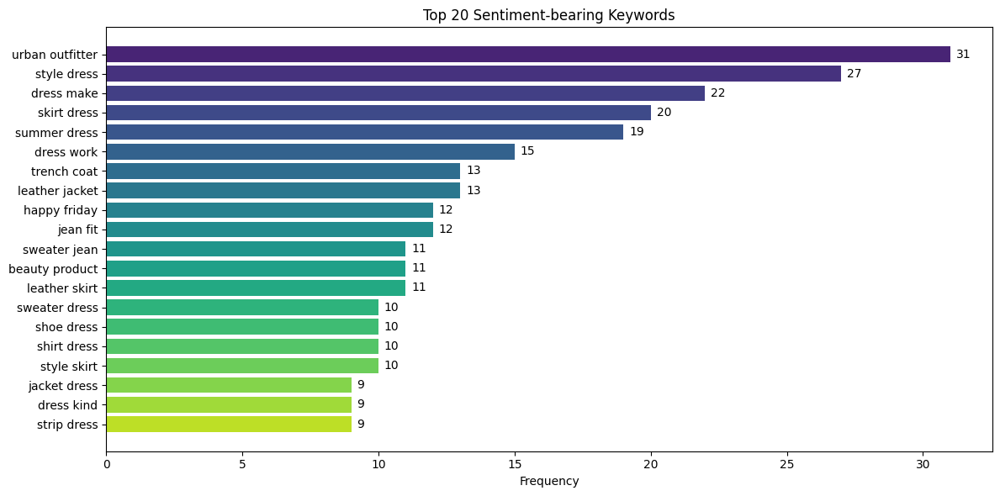

In [ ]:
all_keywords = [
    kw
    for kws in df['kw_bigram']
    for kw in eval(kws)
    if kw not in neutral_words
]

keyword_counts = Counter(all_keywords)
top_keywords = keyword_counts.most_common(20)
labels, values = zip(*top_keywords)

cmap = plt.get_cmap('viridis')
colors = cmap(np.linspace(0.1, 0.9, len(labels)))

fig, ax = plt.subplots(figsize=(12, 6))
bars = ax.barh(labels[::-1], values[::-1], color=colors[::-1])
ax.bar_label(bars, labels=[f"{v}" for v in values[::-1]], padding=5, fontsize=10)

ax.set_title("Top 20 Sentiment‐bearing Keywords")
ax.set_xlabel("Frequency")
plt.tight_layout()
plt.show()


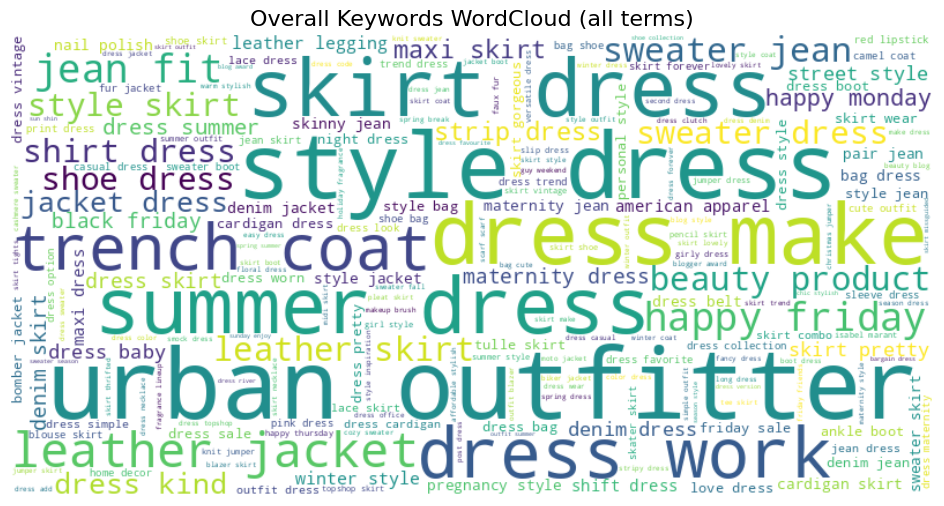

In [ ]:
# Flatten all keywords (excluding neutrals) into one big list
all_keywords = [
    kw
    for kws in df['kw_bigram']
    for kw in eval(kws)
    if kw not in neutral_words
]

# Count frequencies of every keyword
keyword_counts = Counter(all_keywords)

# Generate the WordCloud from the full frequency dict
wc = WordCloud(
    width=800,
    height=400,
    background_color='white',
    colormap='viridis',      # or any other cmap you prefer
    prefer_horizontal=0.9
).generate_from_frequencies(keyword_counts)

# Display
plt.figure(figsize=(12, 6))
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.title("Overall Keywords WordCloud (all terms)", fontsize=16)
plt.show()

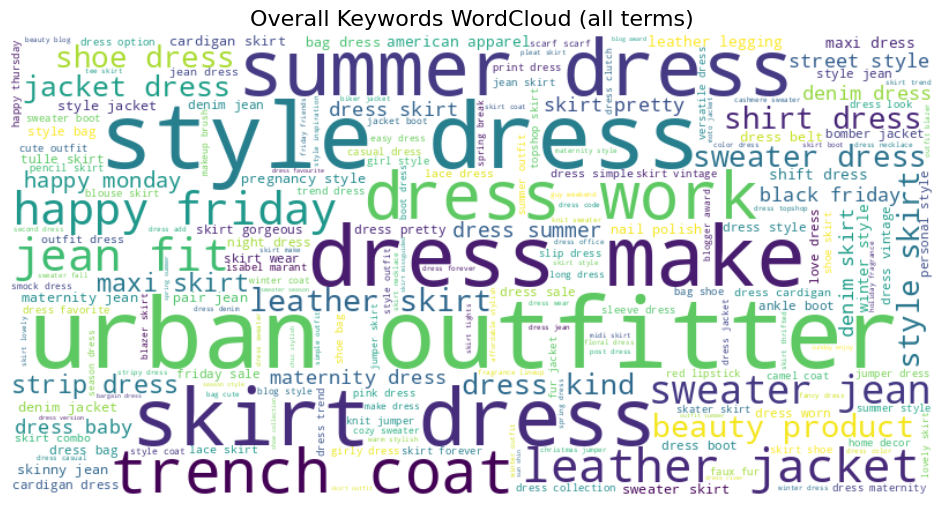

In [ ]:
# Flatten all keywords (excluding neutrals) into one big list
all_keywords = [
    kw
    for kws in df['kw_bigram']
    for kw in eval(kws)
    if kw not in neutral_words
]

# Count frequencies of every keyword
keyword_counts = Counter(all_keywords)

# Generate the WordCloud from the full frequency dict
wc = WordCloud(
    width=800,
    height=400,
    background_color='white',
    colormap='viridis',      # or any other cmap you prefer
    prefer_horizontal=0.9
).generate_from_frequencies(keyword_counts)

# Display
plt.figure(figsize=(12, 6))
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.title("Overall Keywords WordCloud (all terms)", fontsize=16)
plt.show()

## Bar Chart across brands

In [ ]:
brand_keywords = df.groupby('brand_name')['kw_bigram'].apply(
    lambda x: [kw for sublist in x for kw in eval(sublist) if kw not in neutral_words]
)

top_brand_keywords = brand_keywords.apply(lambda x: Counter(x).most_common(20))

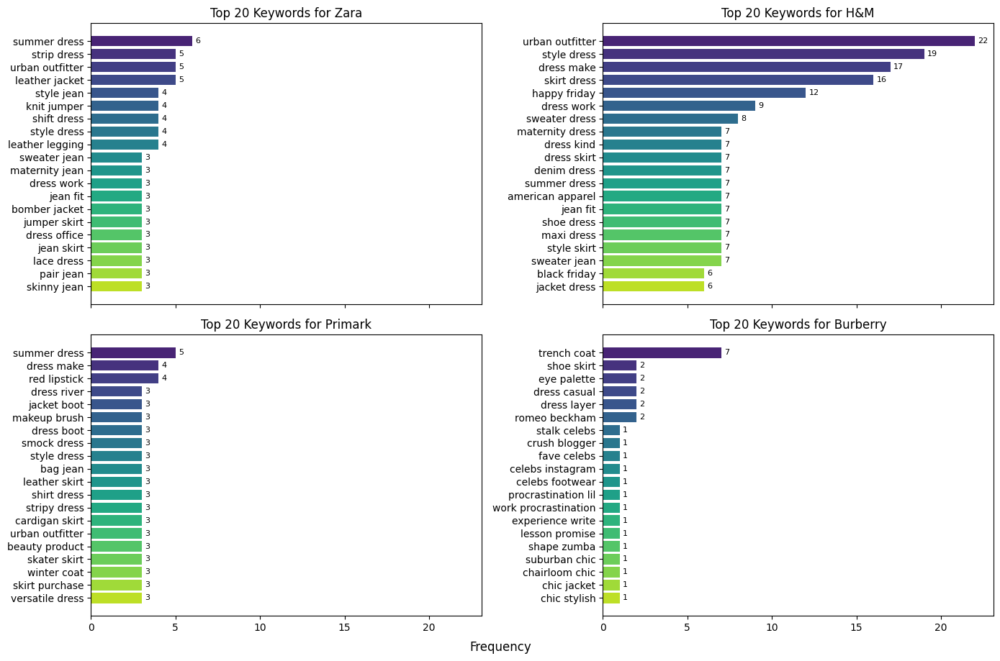

In [ ]:
# Rebuild brand_keywords with neutral words excluded:
brand_keywords = (
    df
    .groupby('brand_name')['kw_bigram']
    .apply(lambda series: [
        kw
        for kws in series
        for kw in eval(kws)
        if kw not in neutral_words
    ])
)

# Compute top-20 per brand
top_brand_keywords = brand_keywords.apply(lambda kw_list: Counter(kw_list).most_common(20))

brands = ['zara', 'h&m', 'primark', 'burberry']
display_names = {
    'zara':     'Zara',
    'h&m':      'H&M',
    'primark':  'Primark',
    'burberry': 'Burberry'
}

fig, axes = plt.subplots(2, 2, figsize=(14, 10), sharex=True)
axes = axes.flatten()
cmap = plt.get_cmap('viridis')

for ax, brand in zip(axes, brands):
    top20 = top_brand_keywords[brand]      # now already filtered
    labels, values = zip(*top20)

    colors = cmap(np.linspace(0.1, 0.9, len(labels)))
    bars = ax.barh(labels, values, color=colors)
    ax.bar_label(bars, labels=[str(v) for v in values], padding=3, fontsize=8)

    ax.set_title(f"Top 20 Keywords for {display_names[brand]}")
    ax.invert_yaxis()

fig.text(0.5, 0.04, 'Frequency', ha='center', fontsize=12)
plt.tight_layout(rect=[0, 0.05, 1, 0.95])
plt.show()

### Word Cloud Visuals

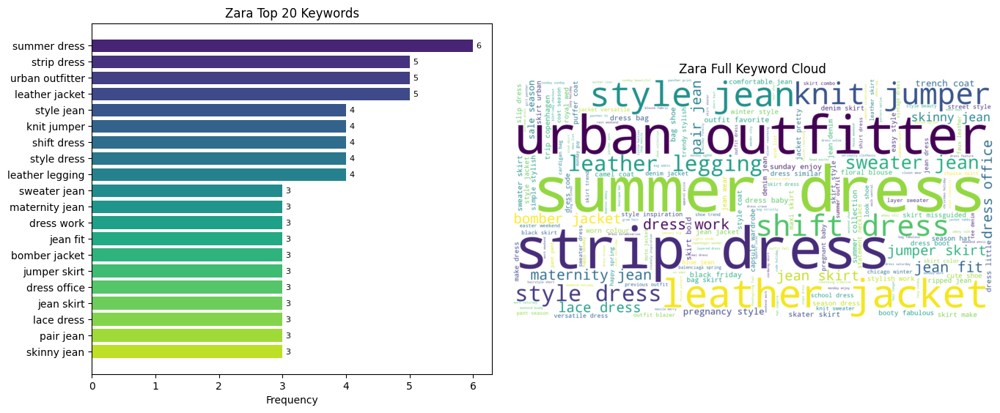

Saved /content/drive/MyDrive/pretrained_refinedweb_updated_shared/wordclouds_only_pos/zara_pos_high_conf_keywords_bi.png


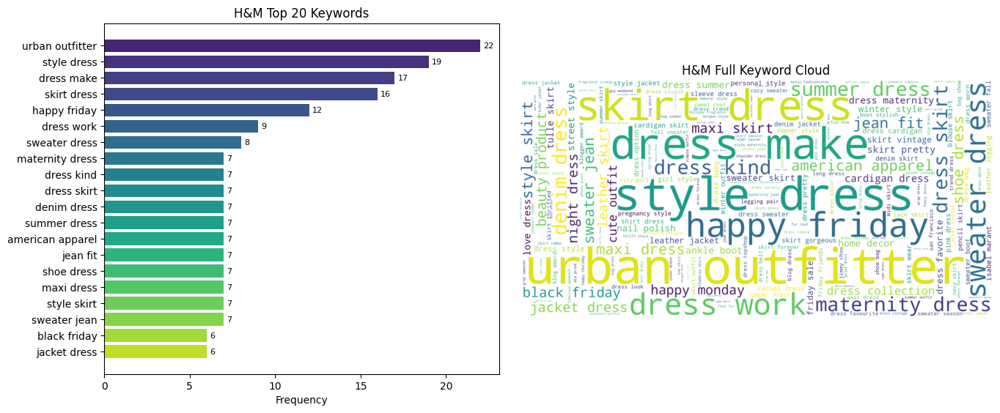

Saved /content/drive/MyDrive/pretrained_refinedweb_updated_shared/wordclouds_only_pos/h&m_pos_high_conf_keywords_bi.png


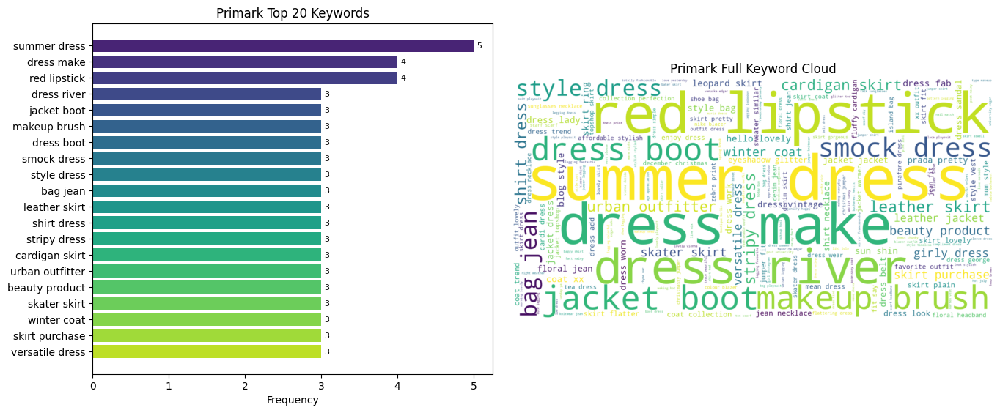

Saved /content/drive/MyDrive/pretrained_refinedweb_updated_shared/wordclouds_only_pos/primark_pos_high_conf_keywords_bi.png


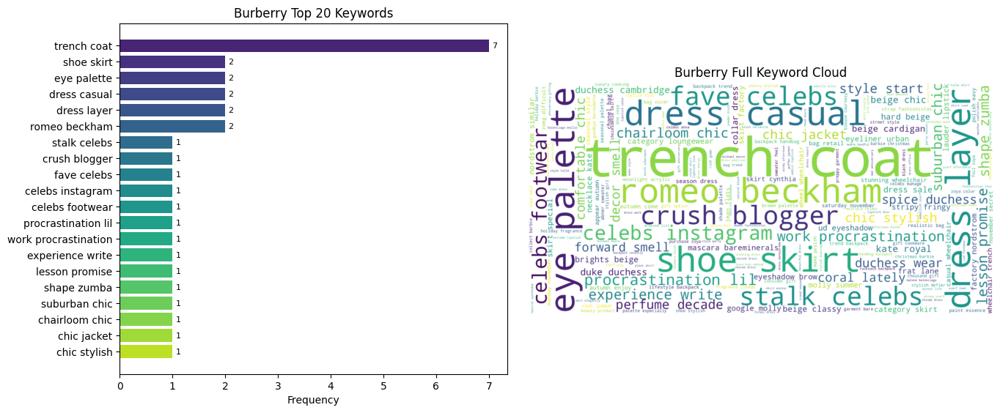

Saved /content/drive/MyDrive/pretrained_refinedweb_updated_shared/wordclouds_only_pos/burberry_pos_high_conf_keywords_bi.png


In [ ]:
brands      = ['zara', 'h&m', 'primark', 'burberry']
display     = {'zara':'Zara','h&m':'H&M','primark':'Primark','burberry':'Burberry'}
neutral     = set(neutral_words)   # your neutral‐word list
output_path = Path("/content/drive/MyDrive/pretrained_refinedweb_updated_shared/wordclouds_only_pos")
output_path.mkdir(parents=True, exist_ok=True)

for brand in brands:
    # 1) gather & filter keywords
    kws = (
        df.loc[df['brand_name']==brand, 'kw_bigram']
          .apply(eval)
          .explode()
          .tolist()
    )
    kws = [kw for kw in kws if kw not in neutral]
    freq = Counter(kws)

    # 2) top-20 for bars
    top20 = freq.most_common(20)
    labels, values = zip(*top20)

    # 3) new figure with 1×2 layout
    fig, (ax_bar, ax_wc) = plt.subplots(1, 2, figsize=(14, 6),
                                        gridspec_kw={'width_ratios': [1,1.2]})

    # — Left: horizontal bar chart
    cmap = plt.get_cmap('viridis')
    colors = cmap(np.linspace(0.1, 0.9, len(values)))
    bars = ax_bar.barh(labels[::-1], values[::-1], color=colors[::-1])
    ax_bar.bar_label(bars, padding=3, fontsize=8)
    ax_bar.set_title(f"{display[brand]} Top 20 Keywords")
    ax_bar.set_xlabel("Frequency")

    # — Right: “spread‐out” wordcloud
    wc = WordCloud(
        width=800,
        height=400,
        background_color='white',
        colormap='viridis',
        max_words=200,
        scale=3,
        prefer_horizontal=0.5
    ).generate_from_frequencies(freq)

    ax_wc.imshow(wc, interpolation='bilinear')
    ax_wc.axis('off')
    ax_wc.set_title(f"{display[brand]} Full Keyword Cloud")

    plt.tight_layout(pad=2.0)

    # **Display inline**
    plt.show()

    # 4) save to PNG
    out_file = output_path / f"{display[brand].lower().replace(' ','_')}_pos_high_conf_keywords_bi.png"
    fig.savefig(out_file, dpi=300, bbox_inches='tight')
    plt.close(fig)

    print(f"Saved {out_file}")


### Top 30 keywords as table

In [ ]:
from IPython.display import display

In [ ]:
# Rebuild brand_keywords with neutral words excluded
brand_keywords = (
    df
    .groupby('brand_name')['kw_bigram']
    .apply(lambda series: [
        kw for kws in series for kw in eval(kws)
        if kw not in neutral_words
    ])
)

# 2) Decide which brands to show and how many keywords
brands        = ['zara', 'h&m', 'primark', 'burberry']
display_names = {
    'zara':     'Zara',
    'h&m':      'H&M',
    'primark':  'Primark',
    'burberry': 'Burberry'
}
top_n = 50

# 3) Build a dict of DataFrames, keyed by the original brand string
df_top_keywords = {}

for brand in brands:
    counts    = Counter(brand_keywords[brand]).most_common(top_n)
    df_brand  = pd.DataFrame(counts, columns=['Keyword', 'Count'])
    df_top_keywords[brand] = df_brand

# 4) (Optional) unpack into four variables if you need them by name
df_top_zara      = df_top_keywords['zara']
df_top_hm        = df_top_keywords['h&m']
df_top_primark  = df_top_keywords['primark']
df_top_burberry = df_top_keywords['burberry']

# 5) Display them all
for brand, tbl in df_top_keywords.items():
    print(f"\nTop {top_n} Keywords for {display_names[brand]}")
    display(tbl)



Top 50 Keywords for Zara


,Keyword,Count
0,summer dress,6
1,strip dress,5
2,urban outfitter,5
3,leather jacket,5
4,style jean,4
5,knit jumper,4
6,shift dress,4
7,style dress,4
8,leather legging,4
9,sweater jean,3



Top 50 Keywords for H&M


,Keyword,Count
0,urban outfitter,22
1,style dress,19
2,dress make,17
3,skirt dress,16
4,happy friday,12
5,dress work,9
6,sweater dress,8
7,maternity dress,7
8,dress kind,7
9,dress skirt,7



Top 50 Keywords for Primark


,Keyword,Count
0,summer dress,5
1,dress make,4
2,red lipstick,4
3,dress river,3
4,jacket boot,3
5,makeup brush,3
6,dress boot,3
7,smock dress,3
8,style dress,3
9,bag jean,3



Top 50 Keywords for Burberry


,Keyword,Count
0,trench coat,7
1,shoe skirt,2
2,eye palette,2
3,dress casual,2
4,dress layer,2
5,romeo beckham,2
6,stalk celebs,1
7,crush blogger,1
8,fave celebs,1
9,celebs instagram,1


In [ ]:
# Rebuild brand_keywords with neutral words excluded
brand_keywords = (
    df
    .groupby('brand_name')['kw_bigram']
    .apply(lambda series: [
        kw
        for kws in series
        for kw in eval(kws)
        if kw not in neutral_words
    ])
)

# Specify brands and their display names
brands = ['zara', 'h&m', 'primark', 'burberry']
display_names = {
    'zara':     'Zara',
    'h&m':      'H&M',
    'primark':  'Primark',
    'burberry': 'Burberry'
}
top_n = 30

# Build a DataFrame of the top-n keywords for each brand
df_top_keywords = {}
for b in brands:
    counts = Counter(brand_keywords[b]).most_common(top_n)
    df_b   = pd.DataFrame(counts, columns=['keyword', 'count'])
    df_b['brand'] = display_names[b]
    df_top_keywords[b] = df_b

# Combine all brand DataFrames into one
df_all = pd.concat(df_top_keywords.values(), ignore_index=True)

# Pivot so each brand becomes its own column of counts
pivot_df = (
    df_all
    .pivot_table(
        index='keyword',
        columns='brand',
        values='count',
        fill_value=0
    )
    .reset_index()
)

# Select keywords present in all four brands
mask_all = (pivot_df[display_names[b]] > 0 for b in brands)
common_keywords = pivot_df.loc[
    pd.concat(mask_all, axis=1).all(axis=1)
].sort_values(by=[display_names[b] for b in brands], ascending=False)

# Select keywords present in exactly one brand
mask_any = (pivot_df[display_names[b]] > 0 for b in brands)
unique_keywords = pivot_df.loc[
    pd.concat(mask_any, axis=1).sum(axis=1) == 1
].sort_values(by=[display_names[b] for b in brands], ascending=False)

In [ ]:
# Render the two tables side-by-side for reporting
html = f"""
<div style="display:flex; gap:40px;">
  <div style="flex:1;">
    <h3>Common Keywords (All 4 Brands)</h3>
    {common_keywords.to_html(index=False)}
  </div>
  <div style="flex:1;">
    <h3>Unique Keywords (Exactly One Brand)</h3>
    {unique_keywords.to_html(index=False)}
  </div>
</div>
"""
display(HTML(html))

brand,keyword,Burberry,H&M,Primark,Zara
brand,keyword,Burberry,H&M,Primark,Zara
,strip dress,0.0,0.0,0.0,5.0
,knit jumper,0.0,0.0,0.0,4.0
,leather legging,0.0,0.0,0.0,4.0
,shift dress,0.0,0.0,0.0,4.0
,style jean,0.0,0.0,0.0,4.0
,bomber jacket,0.0,0.0,0.0,3.0
,dress office,0.0,0.0,0.0,3.0
,jean skirt,0.0,0.0,0.0,3.0
,jumper skirt,0.0,0.0,0.0,3.0


### Bar chart of common keyword (%)

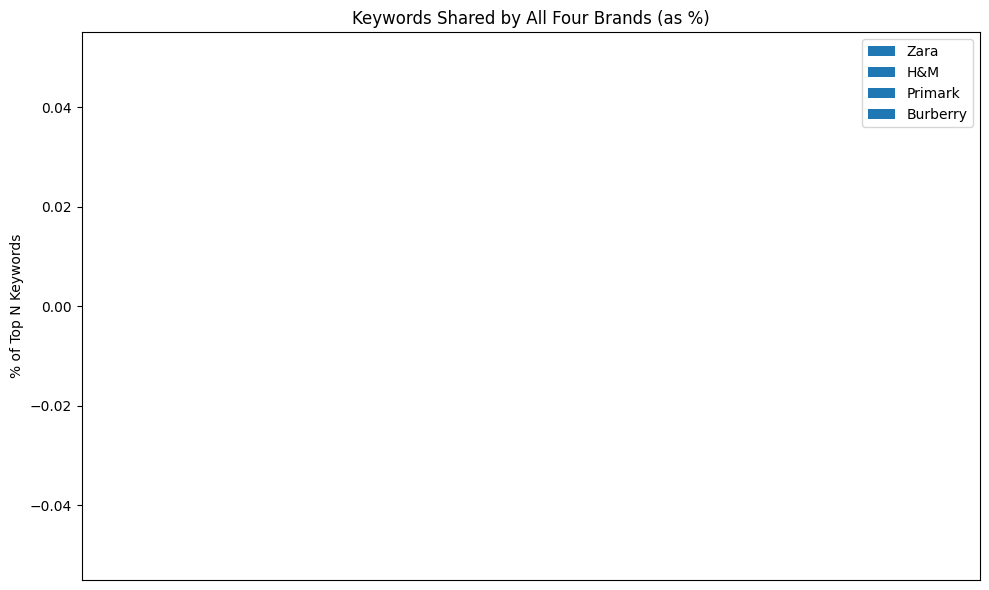

In [ ]:
# Pick up to K common keywords
K = 10
top_common = common_keywords.head(K).set_index('keyword')

# Brands & display names
brands = list(display_names.values())

# Build a (K × 4) matrix of percentages
pct_data = np.vstack([
    (top_common[brand] / top_common[brand].sum() * 100).values
    for brand in brands
]).T  # shape = (K, 4)

actual_K = pct_data.shape[0]

fig, ax = plt.subplots(figsize=(10, 6))

x     = np.arange(actual_K)
width = 0.8 / len(brands)

# use the Paired colormap (which has 12 distinct, formal-yet-vibrant colors)
cmap = plt.get_cmap('Paired')
colors = cmap.colors[:len(brands)]  # take as many as you need (4 here)

for i, (brand, color) in enumerate(zip(brands, colors)):
    ax.bar(x + i*width, pct_data[:, i], width, label=brand, color=color)

ax.set_xticks(x + width*(len(brands)-1)/2)
ax.set_xticklabels(top_common.index, rotation=45, ha='right')
ax.set_ylabel("% of Top N Keywords")
ax.set_title("Keywords Shared by All Four Brands (as %)")
ax.legend()

plt.tight_layout()
plt.show()


### Bar chart of unique keywords across brands

In [ ]:
# Output path for saving
output_path = Path("/content/drive/MyDrive/pretrained_refinedweb_updated_shared/wordclouds_only_pos")
output_path.mkdir(parents=True, exist_ok=True)

# Brand settings
brands = ['zara', 'h&m', 'primark', 'burberry']
display = {'zara': 'Zara', 'h&m': 'H&M', 'primark': 'Primark', 'burberry': 'Burberry'}
M = 10
cmap = plt.colormaps['cividis']  # For matplotlib >=3.7

# Create square layout (2x2)
fig, axes = plt.subplots(2, 2, figsize=(12, 10), sharex=True)
axes = axes.flatten()

# Plot for each brand
for ax, brand in zip(axes, brands):
    display_name = display[brand]

    uniq = unique_keywords[unique_keywords[display_name] > 0].nlargest(M, display_name)
    values = uniq[display_name].values

    norm = Normalize(vmin=values.min(), vmax=values.max())
    colors = cmap(norm(values))

    ax.barh(uniq['keyword'], values, color=colors)
    ax.invert_yaxis()
    ax.set_title(f"{display_name}-only Keywords")
    ax.set_xlabel("Frequency")

plt.tight_layout()

# Save the full 2x2 grid as one image
out_file = output_path / f"{display[brand].lower().replace(' ','_')}_pos_high_conf_unique_keywords_bigram.png"
fig.savefig(out_file, dpi=300, bbox_inches='tight')
plt.close(fig)

# Show inline
plt.show()
plt.close(fig)

print(f"Saved {out_file}")


Saved /content/drive/MyDrive/pretrained_refinedweb_updated_shared/wordclouds_only_pos/burberry_pos_high_conf_unique_keywords_bigram.png


## Heatmap of Common Top Keywords

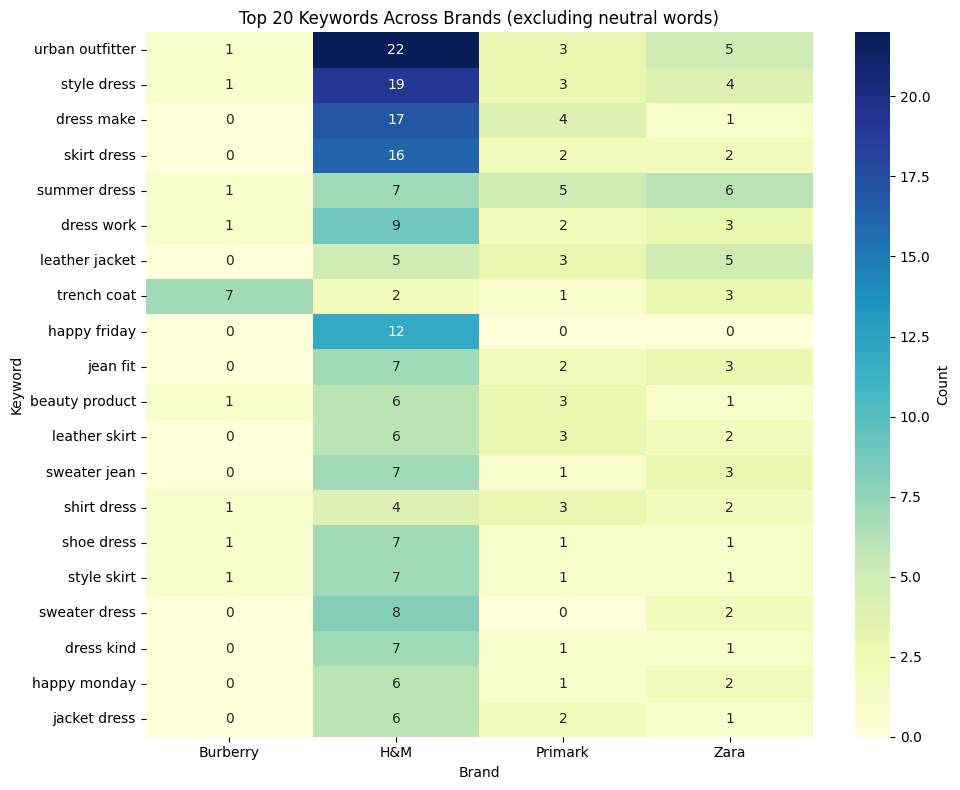

In [ ]:
# Build long-form DataFrame
rows = []
for key, kws in brand_keywords.items():
    label = display_names.get(key, key)
    for kw, cnt in Counter(kws).items():
        if kw not in neutral_words:
            rows.append((label, kw, cnt))
df = pd.DataFrame(rows, columns=['brand', 'keyword', 'count'])

# Pivot to matrix
pivot = df.pivot_table(
    index='keyword',
    columns='brand',
    values='count',
    fill_value=0
)

# Keep only top 20 keywords
top20 = pivot.sum(axis=1).nlargest(20).index
pivot = pivot.loc[top20]

# Plot heatmap with a smooth sequential palette
plt.figure(figsize=(10, 8))
sns.heatmap(
    pivot,
    annot=True,
    fmt=".0f",         # integer‐style formatting
    cmap="YlGnBu",     # smooth yellow→green→blue
    cbar_kws={'label': 'Count'}
)
plt.title("Top 20 Keywords Across Brands (excluding neutral words)")
plt.ylabel("Keyword")
plt.xlabel("Brand")
plt.tight_layout()
plt.show()

-- End of the notebook --